<a href="https://colab.research.google.com/github/mloki23/just-crap/blob/main/Trading_Scripts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[*********************100%%**********************]  1 of 1 completed


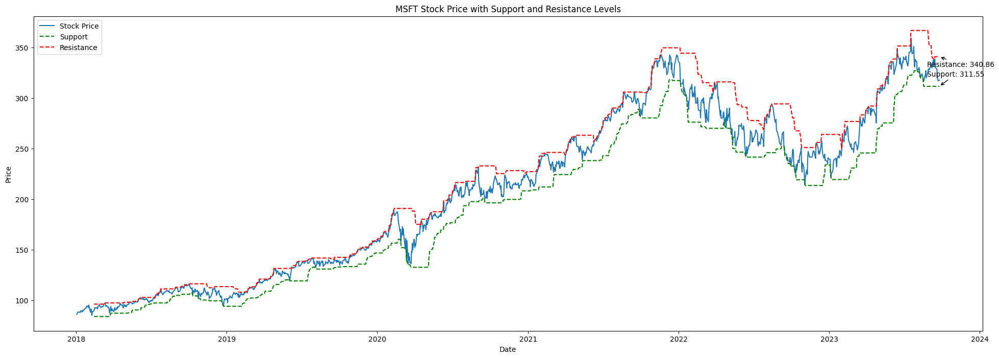

In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

def find_levels(data, window):
    high = data['High'].rolling(window=window).max()
    low = data['Low'].rolling(window=window).min()
    midpoint = (high + low) / 2
    diff = high - low
    resistance = midpoint + (diff / 2)
    support = midpoint - (diff / 2)
    return support, resistance

# Download historical stock prices
symbol = "MSFT"
start_date = '2018-01-01'
end_date = '2023-12-30'
data = yf.download(symbol, start=start_date, end=end_date)

window = 30

# Calculate support and resistance levels
support, resistance = find_levels(data, window)

# Plot the stock price, support, and resistance lines
fig, ax = plt.subplots(figsize=(24, 8))
ax.plot(data.index, data['Close'], label='Stock Price')
ax.plot(data.index, support, label='Support', linestyle='--', color='green')
ax.plot(data.index, resistance, label='Resistance', linestyle='--', color='red')
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.set_title(f'{symbol} Stock Price with Support and Resistance Levels')
ax.legend()

# Add annotations for last support and resistance levels
last_support = support.iloc[-1]
last_resistance = resistance.iloc[-1]
ax.annotate(f'Support: {last_support:.2f}', xy=(support.index[-1], last_support),
            xytext=(support.index[-1] - pd.DateOffset(days=30), last_support + 10),
            arrowprops=dict(facecolor='green', arrowstyle='->'))
ax.annotate(f'Resistance: {last_resistance:.2f}', xy=(resistance.index[-1], last_resistance),
            xytext=(resistance.index[-1] - pd.DateOffset(days=30), last_resistance - 10),
            arrowprops=dict(facecolor='red', arrowstyle='->'))

plt.show()

[*********************100%%**********************]  1 of 1 completed


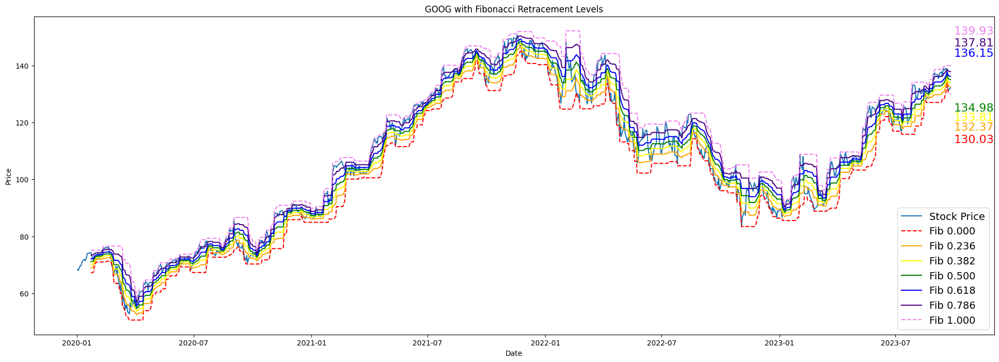

In [2]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Get the stock data for ASML.AS
symbol = "GOOG"
stock_data = yf.download(symbol, start="2020-01-01", end="2023-12-17")

# Define the lookback period for calculating high and low prices
lookback_period = 15

# Calculate the high and low prices over the lookback period
high_prices = stock_data["High"].rolling(window=lookback_period).max()
low_prices = stock_data["Low"].rolling(window=lookback_period).min()

# Calculate the price difference and Fibonacci levels
price_diff = high_prices - low_prices
levels = np.array([0, 0.236, 0.382, 0.5, 0.618, 0.786, 1])
fib_levels = low_prices.values.reshape(-1, 1) + price_diff.values.reshape(-1, 1) * levels

# Get the last price for each Fibonacci level
last_prices = fib_levels[-1, :]

# Define a color palette for the Fibonacci levels
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'indigo', 'violet']

# Plot the stock price with the Fibonacci retracement levels and last prices
fig, ax = plt.subplots(figsize=(24,8))
ax.plot(stock_data.index, stock_data["Close"], label="Stock Price")

offsets = [-16, -14, -12, -10, 8, 10, 12]

for i, level in enumerate(levels):
    if level == 0 or level == 1:
        linestyle = "--"
    else:
        linestyle = "-"
    ax.plot(stock_data.index, fib_levels[:, i], label=f"Fib {level:.3f}", linestyle=linestyle, color=colors[i])
    ax.annotate(f"{last_prices[i]:.2f}",
                xy=(stock_data.index[-1], fib_levels[-1, i]),
                xytext=(stock_data.index[-1] + pd.Timedelta(days=5), fib_levels[-1, i] + offsets[i]),
                ha="left", va="center", fontsize=16, color=colors[i])

ax.set_xlabel("Date")
ax.set_ylabel("Price")
ax.set_title(f"{symbol} with Fibonacci Retracement Levels")
ax.legend(loc="lower right", fontsize=14)

plt.show()


[*********************100%%**********************]  1 of 1 completed


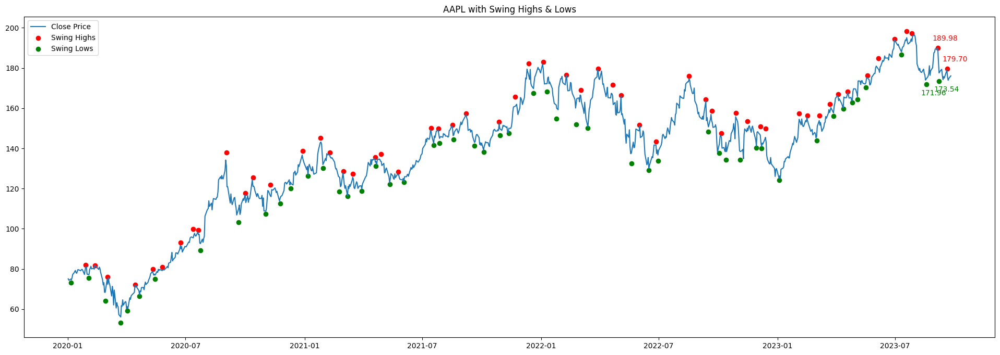

In [3]:
import yfinance as yf
import pandas as pd
from scipy.signal import argrelextrema
import matplotlib.pyplot as plt

# Download stock data
symbol = "AAPL"
stock_data = yf.download(symbol, start="2020-01-01", end="2023-12-17")

# Identify local maxima (swing highs)
stock_data['Swing_High'] = stock_data['High'][argrelextrema(stock_data['High'].values, np.greater_equal, order=5)[0]]

# Identify local minima (swing lows)
stock_data['Swing_Low'] = stock_data['Low'][argrelextrema(stock_data['Low'].values, np.less_equal, order=5)[0]]

# Find last two non-NaN values for Swing Highs and Swing Lows
last_two_resistances = stock_data['Swing_High'].dropna().tail(2)
last_two_supports = stock_data['Swing_Low'].dropna().tail(2)

# Plotting
plt.figure(figsize=(24,8))
plt.plot(stock_data['Close'], label="Close Price")
plt.scatter(stock_data.index, stock_data['Swing_High'], color='r', label='Swing Highs', marker='o')
plt.scatter(stock_data.index, stock_data['Swing_Low'], color='g', label='Swing Lows', marker='o')

# Annotate the last two resistance and support prices
for date, price in last_two_resistances.items():
    plt.annotate(f"{price:.2f}", (date, price), textcoords="offset points", xytext=(10,10), ha='center', color='r')

for date, price in last_two_supports.items():
    plt.annotate(f"{price:.2f}", (date, price), textcoords="offset points", xytext=(10,-15), ha='center', color='g')

plt.title(f'{symbol} with Swing Highs & Lows')
plt.legend()
plt.show()


[*********************100%%**********************]  1 of 1 completed


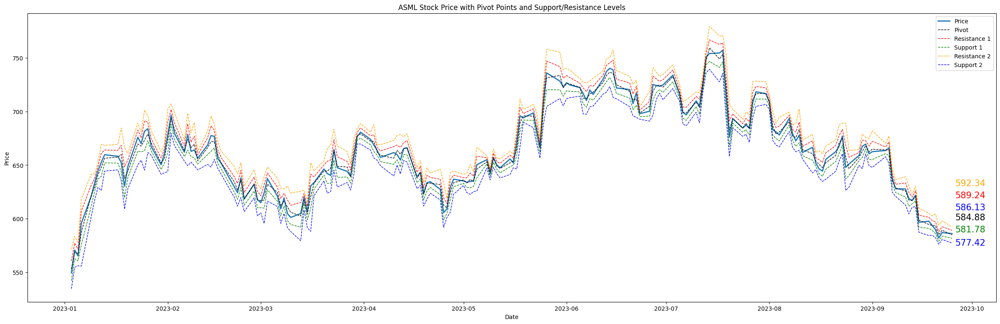

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf

def calculate_pivot_points(df):
    df['Pivot'] = (df['High'] + df['Low'] + df['Close']) / 3
    df['R1'] = 2 * df['Pivot'] - df['Low']
    df['S1'] = 2 * df['Pivot'] - df['High']
    df['R2'] = df['Pivot'] + (df['High'] - df['Low'])
    df['S2'] = df['Pivot'] - (df['High'] - df['Low'])
    return df

ticker = 'ASML'
start_date = '2023-01-01'
end_date = '2023-12-31'

data = yf.download(ticker, start=start_date, end=end_date)
df = calculate_pivot_points(data)
df = df.dropna()

fig, ax = plt.subplots(figsize=(30, 9))

ax.plot(df.index, df['Close'], label='Price', linewidth=2)
ax.plot(df.index, df['Pivot'], label='Pivot', linestyle='--', linewidth=1, color='black')
ax.plot(df.index, df['R1'], label='Resistance 1', linestyle='--', linewidth=1, color='red')
ax.plot(df.index, df['S1'], label='Support 1', linestyle='--', linewidth=1, color='green')
ax.plot(df.index, df['R2'], label='Resistance 2', linestyle='--', linewidth=1, color='orange')
ax.plot(df.index, df['S2'], label='Support 2', linestyle='--', linewidth=1, color='blue')

ax.set_title(f'{ticker} Stock Price with Pivot Points and Support/Resistance Levels')
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.legend()

# Annotate prices for the last observation
last_date = df.index[-1]
points = {
    'Price': df['Close'].iloc[-1],
    'Pivot': df['Pivot'].iloc[-1],
    'R1': df['R1'].iloc[-1],
    'S1': df['S1'].iloc[-1],
    'R2': df['R2'].iloc[-1],
    'S2': df['S2'].iloc[-1],
}

colors = {
    'Price': 'blue',
    'Pivot': 'black',
    'R1': 'red',
    'S1': 'green',
    'R2': 'orange',
    'S2': 'blue'
}

sorted_points = sorted(points.items(), key=lambda x: x[1])

for i, (label, value) in enumerate(sorted_points):
    ax.annotate(f"{value:.2f}", xy=(last_date, value), xytext=(5, i * 15),
                textcoords="offset points", fontsize=15, ha='left', va='center', color=colors[label])

plt.show()

[*********************100%%**********************]  1 of 1 completed


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


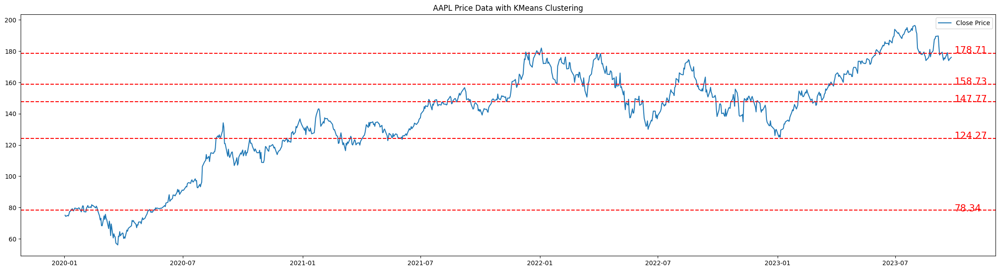

In [5]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Download stock data
symbol = "AAPL"
stock_data = yf.download(symbol, start="2020-01-01", end="2023-12-17")

# Preparing data for clustering: Normalize time and price to have similar scales
X_time = np.linspace(0, 1, len(stock_data)).reshape(-1, 1)
X_price = (stock_data['Close'].values - np.min(stock_data['Close'])) / (np.max(stock_data['Close']) - np.min(stock_data['Close']))
X_cluster = np.column_stack((X_time, X_price))

# Applying KMeans clustering
num_clusters = 5
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X_cluster)

# Extract cluster centers and rescale back to original price range
cluster_centers = kmeans.cluster_centers_[:, 1] * (np.max(stock_data['Close']) - np.min(stock_data['Close'])) + np.min(stock_data['Close'])

# Plotting
plt.figure(figsize=(28,7))
plt.plot(stock_data['Close'], label="Close Price")
for center in cluster_centers:
    plt.axhline(y=center, color='r', linestyle='--')
    plt.annotate(f"{center:.2f}", xy=(stock_data.index[-1], center * 1.01), xytext=(5,0), textcoords="offset points", fontsize=15, ha='left', va='center', color='r')

plt.title(f'{symbol} Price Data with KMeans Clustering')
plt.legend()
plt.show()

[*********************100%%**********************]  1 of 1 completed


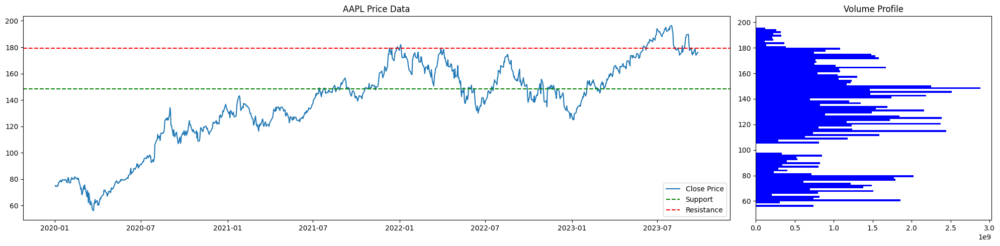

Estimated Support Price: 148.41
Estimated Resistance Price: 179.18


In [6]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt

# Download stock data
symbol = "AAPL"
stock_data = yf.download(symbol, start="2020-01-01", end="2023-12-17")

# Calculate volume profile
price_bins = np.linspace(stock_data['Low'].min(), stock_data['High'].max(), 100)
volume_profile = []

for i in range(len(price_bins)-1):
    bin_mask = (stock_data['Close'] > price_bins[i]) & (stock_data['Close'] <= price_bins[i+1])
    volume_profile.append(stock_data['Volume'][bin_mask].sum())

# Estimating support and resistance
current_price = stock_data['Close'].iloc[-1]
support_idx = np.argmax(volume_profile[:np.digitize(current_price, price_bins)])
resistance_idx = np.argmax(volume_profile[np.digitize(current_price, price_bins):]) + np.digitize(current_price, price_bins)

support_price = price_bins[support_idx]
resistance_price = price_bins[resistance_idx]

# Plotting
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 5), gridspec_kw={'width_ratios': [3, 1]})
ax1.plot(stock_data['Close'], label="Close Price")
ax1.axhline(y=support_price, color='g', linestyle='--', label='Support')
ax1.axhline(y=resistance_price, color='r', linestyle='--', label='Resistance')
ax1.legend()
ax1.set_title(f'{symbol} Price Data')
ax2.barh(price_bins[:-1], volume_profile, height=(price_bins[1] - price_bins[0]), color='blue', edgecolor='none')
ax2.set_title('Volume Profile')

plt.tight_layout()
plt.show()

print(f"Estimated Support Price: {support_price:.2f}")
print(f"Estimated Resistance Price: {resistance_price:.2f}")


[*********************100%%**********************]  1 of 1 completed


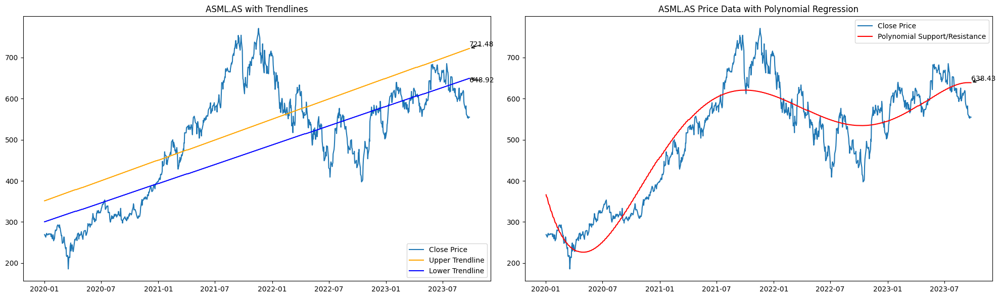

In [7]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Specify the ticker
symbol = "ASML.AS"

# Download stock data
stock_data = yf.download(symbol, start="2020-01-01", end="2023-12-17")

# Identify local maxima (swing highs) and minima (swing lows)
swing_highs = argrelextrema(stock_data['High'].values, np.greater_equal, order=5)[0]
swing_lows = argrelextrema(stock_data['Low'].values, np.less_equal, order=5)[0]

# Linear regression for trendlines
upper_m, upper_b = np.polyfit(swing_highs, stock_data['High'].values[swing_highs], 1)
lower_m, lower_b = np.polyfit(swing_lows, stock_data['Low'].values[swing_lows], 1)

stock_data['Upper_Trendline'] = upper_m * np.arange(len(stock_data)) + upper_b
stock_data['Lower_Trendline'] = lower_m * np.arange(len(stock_data)) + lower_b

# Preparing data for polynomial regression
X = np.array(range(len(stock_data))).reshape(-1, 1)
y = stock_data['Close'].values

# Polynomial regression
poly = PolynomialFeatures(degree=5)
X_poly = poly.fit_transform(X)
poly_regressor = LinearRegression()
poly_regressor.fit(X_poly, y)
y_pred = poly_regressor.predict(X_poly)

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
ax1.plot(stock_data['Close'], label="Close Price")
ax1.plot(stock_data['Upper_Trendline'], label="Upper Trendline", color="orange")
ax1.plot(stock_data['Lower_Trendline'], label="Lower Trendline", color="blue")

# Annotate last prices for Trendlines
ax1.annotate(f"{stock_data['Upper_Trendline'].iloc[-1]:.2f}",
             xy=(stock_data.index[-1], stock_data['Upper_Trendline'].iloc[-1]),
             xytext=(stock_data.index[-1], stock_data['Upper_Trendline'].iloc[-1] + 5),
             arrowprops=dict(arrowstyle='->'))

ax1.annotate(f"{stock_data['Lower_Trendline'].iloc[-1]:.2f}",
             xy=(stock_data.index[-1], stock_data['Lower_Trendline'].iloc[-1]),
             xytext=(stock_data.index[-1], stock_data['Lower_Trendline'].iloc[-1] - 10),
             arrowprops=dict(arrowstyle='->'))

ax1.set_title(f'{symbol} with Trendlines')
ax1.legend(loc = "lower right")

ax2.plot(stock_data['Close'], label="Close Price")
ax2.plot(stock_data.index, y_pred, color='r', label="Polynomial Support/Resistance")

# Annotate last price for Polynomial Regression
ax2.annotate(f"{y_pred[-1]:.2f}",
             xy=(stock_data.index[-1], y_pred[-1]),
             xytext=(stock_data.index[-1], y_pred[-1] + 5),
             arrowprops=dict(arrowstyle='->'))

ax2.set_title(f'{symbol} Price Data with Polynomial Regression')
ax2.legend()

plt.tight_layout()
plt.show()


[*********************100%%**********************]  1 of 1 completed
BMS Implied Volatility:  0.29
Historical Volatility:  0.023940527743948416


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


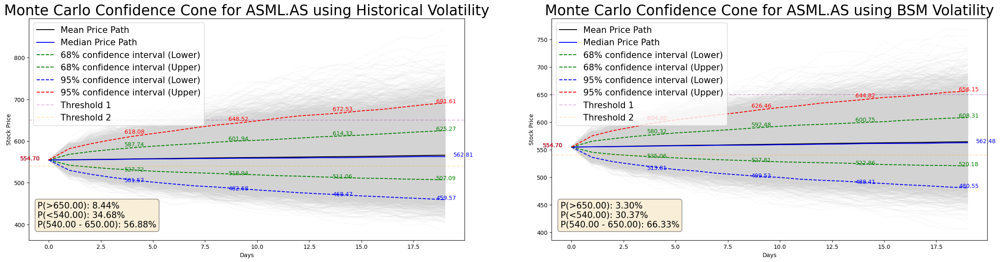

In [10]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from scipy.stats import norm

# Download historical data for ASML.AS
symbol = "ASML.AS"
start_date = "2020-01-01"
end_date = "2023-12-30"
df = yf.download(symbol, start=start_date, end=end_date)

# Calculate daily returns
log_returns = np.log(df['Close'] / df['Close'].shift(1))

# Monte Carlo simulation parameters
days_to_forecast = 20
num_simulations = 10000
dt = 1  # 1 trading day

# Define thresholds
threshold2 = 540 #144 #116
threshold1 = 650 #162 #128

# Volatility for BSM
volatility_bsm = 0.29 # Assuming 29% annualized volatility

print("BMS Implied Volatility: ", volatility_bsm)

# Run Monte Carlo simulations
def run_simulation(volatility, dt, annualized=False):
    simulated_prices = np.zeros((days_to_forecast, num_simulations))
    simulated_prices[0] = df['Close'][-1]

    # Adjust volatility for annualized estimates
    if annualized:
        volatility = volatility / np.sqrt(252)

    for t in range(1, days_to_forecast):
        random_walk = np.random.normal(loc=log_returns.mean() * dt,
                                       scale=volatility * np.sqrt(dt),
                                       size=num_simulations)
        simulated_prices[t] = simulated_prices[t - 1] * np.exp(random_walk)
    return simulated_prices

simulated_prices_historical = run_simulation(log_returns.std(), dt)
simulated_prices_bsm = run_simulation(volatility_bsm, dt, annualized=True)

print("Historical Volatility: ", log_returns.std())

# Plot the results
fig, axs = plt.subplots(1, 2, figsize=(30, 7))

for simulated_prices, ax, title in zip([simulated_prices_historical, simulated_prices_bsm], axs, ['Historical Volatility', 'BSM Volatility']):
    mean_price_path = np.mean(simulated_prices, axis=1)
    median_price_path = np.median(simulated_prices, axis=1)
    lower_bound_68 = np.percentile(simulated_prices, 16, axis=1)
    upper_bound_68 = np.percentile(simulated_prices, 84, axis=1)
    lower_bound_95 = np.percentile(simulated_prices, 2.5, axis=1)
    upper_bound_95 = np.percentile(simulated_prices, 97.5, axis=1)

    # Define thresholds
    threshold1 = threshold1
    threshold2 = threshold2

    ax.plot(simulated_prices, color='lightgray', alpha=0.1)
    ax.plot(mean_price_path, color='black', label='Mean Price Path')
    ax.plot(median_price_path, color='blue', label='Median Price Path')
    ax.plot(lower_bound_68, color='green', linestyle='--', label='68% confidence interval (Lower)')
    ax.plot(upper_bound_68, color='green', linestyle='--', label='68% confidence interval (Upper)')
    ax.plot(lower_bound_95, color='blue', linestyle='--', label='95% confidence interval (Lower)')
    ax.plot(upper_bound_95, color='red', linestyle='--', label='95% confidence interval (Upper)')

    ax.axhline(y=threshold1, color='purple', linestyle='--', alpha=0.25, label='Threshold 1')
    ax.axhline(y=threshold2, color='orange', linestyle='--', alpha=0.25, label='Threshold 2')

    # Plot settings
    ax.set_xlabel('Days')
    ax.set_ylabel('Stock Price')
    ax.set_title(f'Monte Carlo Confidence Cone for {symbol} using {title}', fontsize = 25)
    ax.legend(fontsize = 15)

    # Add price estimates every 5 days
    for day in range(0, days_to_forecast, 5):
        ax.annotate(f'{lower_bound_68[day]:.2f}', xy=(day, lower_bound_68[day]), xycoords='data',
                    xytext=(-50, 0), textcoords='offset points', color='green')
        ax.annotate(f'{upper_bound_68[day]:.2f}', xy=(day, upper_bound_68[day]), xycoords='data',
                    xytext=(-50, 0), textcoords='offset points', color='green')
        ax.annotate(f'{lower_bound_95[day]:.2f}', xy=(day, lower_bound_95[day]), xycoords='data',
                    xytext=(-50, 0), textcoords='offset points', color='blue')
        ax.annotate(f'{upper_bound_95[day]:.2f}', xy=(day, upper_bound_95[day]), xycoords='data',
                    xytext=(-50, 0), textcoords='offset points', color='red')

    # Add probability annotations
    above_threshold1_prob = (simulated_prices[-1] > threshold1).sum() / num_simulations
    below_threshold2_prob = (simulated_prices[-1] < threshold2).sum() / num_simulations
    between_thresholds_prob = 1 - above_threshold1_prob - below_threshold2_prob

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    ax.text(0.02, 0.05, f'P(>{threshold1:.2f}): {above_threshold1_prob:.2%}\n'
                       f'P(<{threshold2:.2f}): {below_threshold2_prob:.2%}\n'
                       f'P({threshold2:.2f} - {threshold1:.2f}): {between_thresholds_prob:.2%}',
            transform=ax.transAxes, fontsize=15,
            verticalalignment='bottom', bbox=props)

    # Add mean price path labels
    #ax.annotate(f'{mean_price_path[-1]:.2f}', xy=(days_to_forecast - 1, mean_price_path[-1]), xycoords='data',
    #            xytext=(15, 0), textcoords='offset points', color='black')

    # Add median price path labels
    ax.annotate(f'{median_price_path[-1]:.2f}', xy=(days_to_forecast - 1, median_price_path[-1]), xycoords='data',
                xytext=(15, 0), textcoords='offset points', color='blue')

    # Add price labels
    ax.annotate(f'{lower_bound_68[-1]:.2f}', xy=(days_to_forecast - 1, lower_bound_68[-1]), xycoords='data',
                xytext=(-15, 0), textcoords='offset points', color='green')
    ax.annotate(f'{upper_bound_68[-1]:.2f}', xy=(days_to_forecast - 1, upper_bound_68[-1]), xycoords='data',
                xytext=(-15, 0), textcoords='offset points', color='green')
    ax.annotate(f'{lower_bound_95[-1]:.2f}', xy=(days_to_forecast - 1, lower_bound_95[-1]), xycoords='data',
                xytext=(-15, 0), textcoords='offset points', color='blue')
    ax.annotate(f'{upper_bound_95[-1]:.2f}', xy=(days_to_forecast - 1, upper_bound_95[-1]), xycoords='data',
                xytext=(-15, 0), textcoords='offset points', color='red')

plt.show()

[*********************100%%**********************]  1 of 1 completed


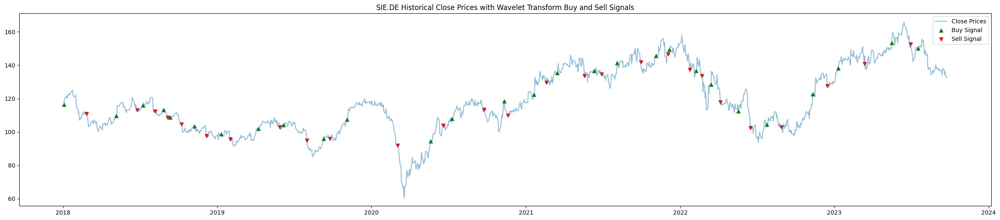

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
from scipy import signal

# Download ASML.AS historical stock data
ticker = "SIE.DE"
stock_data = yf.download(ticker, start="2018-01-01", end="2023-12-30")

# Compute the Continuous Wavelet Transform (CWT) using the Ricker wavelet
widths = np.arange(1, 15)
cwt_result = signal.cwt(stock_data['Close'].values, signal.ricker, widths)

# Extract the relevant CWT coefficients for analysis
cwt_positive = np.where(cwt_result > 0, cwt_result, 0)
cwt_negative = np.where(cwt_result < 0, cwt_result, 0)

# Calculate the buy and sell signals from the CWT coefficients
buy_signal = pd.Series(np.sum(cwt_positive, axis=0), index=stock_data.index)
sell_signal = pd.Series(-np.sum(cwt_negative, axis=0), index=stock_data.index)

# Identify buy and sell signal crossovers
cross_above = (buy_signal >= sell_signal) & (buy_signal.shift(1) < sell_signal.shift(1))
cross_below = (buy_signal <= sell_signal) & (buy_signal.shift(1) > sell_signal.shift(1))

# Plot the stock prices and buy/sell signals
plt.figure(figsize=(30, 6))
plt.plot(stock_data.index, stock_data['Close'], label='Close Prices', alpha=0.5)
plt.scatter(stock_data.index[cross_above], stock_data['Close'][cross_above], label='Buy Signal', marker='^', color='g')
plt.scatter(stock_data.index[cross_below], stock_data['Close'][cross_below], label='Sell Signal', marker='v', color='r')
plt.title(f'{ticker} Historical Close Prices with Wavelet Transform Buy and Sell Signals')
plt.legend()
plt.show()

[*********************100%%**********************]  1 of 1 completed
Best widths: 14
Best threshold: 0.5
Best performance: 176.25659295739393%


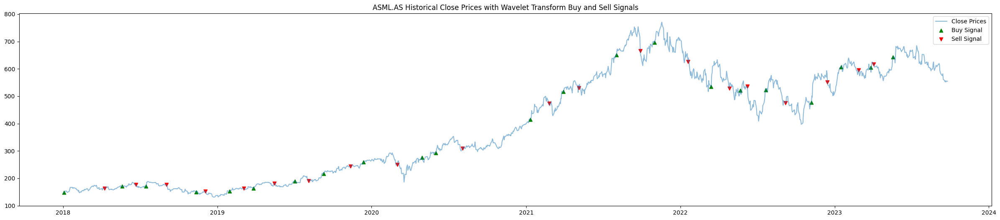

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
from scipy import signal

# Download ASML.AS historical stock data
ticker = "ASML.AS"
stock_data = yf.download(ticker, start="2018-01-01", end="2023-12-30")

# Define parameter ranges
widths_range = np.arange(1, 15)
threshold_range = np.arange(0.1, 1.0, 0.1)

# Store the best parameters and their performance
best_widths = None
best_threshold = None
best_performance = -np.inf

def backtest(stock_data, cross_above, cross_below):
    # We'll start with one "unit" of cash
    cash = 1.0
    stock = 0.0
    position = "out"

    # Go through each day in our data
    for i in range(len(stock_data)):
        # If we have a buy signal and we're not already holding the stock
        if cross_above[i] and position == "out":
            # Buy the stock
            stock += cash / stock_data['Close'][i]
            cash = 0.0
            position = "in"
        # If we have a sell signal and we're holding the stock
        elif cross_below[i] and position == "in":
            # Sell the stock
            cash += stock * stock_data['Close'][i]
            stock = 0.0
            position = "out"

    # Return our final portfolio value
    if position == "in":
        return cash + stock * stock_data['Close'][-1]
    else:
        return cash

# Go through each combination of parameters
for widths in widths_range:
    for threshold in threshold_range:
        # Compute the CWT
        cwt_result = signal.cwt(stock_data['Close'].values, signal.ricker, [widths])

        # Extract relevant coefficients
        cwt_positive = np.where(cwt_result > threshold, cwt_result, 0)
        cwt_negative = np.where(cwt_result < -threshold, cwt_result, 0)

        # Calculate signals
        buy_signal = pd.Series(np.sum(cwt_positive, axis=0), index=stock_data.index)
        sell_signal = pd.Series(-np.sum(cwt_negative, axis=0), index=stock_data.index)
        cross_above = (buy_signal >= sell_signal) & (buy_signal.shift(1) < sell_signal.shift(1))
        cross_below = (buy_signal <= sell_signal) & (buy_signal.shift(1) > sell_signal.shift(1))

        # Calculate performance based on trading signals
        performance = backtest(stock_data, cross_above, cross_below)

        # Update best parameters if this performance is better
        if performance > best_performance:
            best_performance = performance
            best_widths = widths
            best_threshold = threshold

# Print the best parameters
print(f"Best widths: {best_widths}")
print(f"Best threshold: {best_threshold}")
print(f"Best performance: {best_performance * 100}%")

# Recalculate the CWT and buy/sell signals using the best parameters
cwt_result = signal.cwt(stock_data['Close'].values, signal.ricker, [best_widths])
cwt_positive = np.where(cwt_result > best_threshold, cwt_result, 0)
cwt_negative = np.where(cwt_result < -best_threshold, cwt_result, 0)
buy_signal = pd.Series(np.sum(cwt_positive, axis=0), index=stock_data.index)
sell_signal = pd.Series(-np.sum(cwt_negative, axis=0), index=stock_data.index)
cross_above = (buy_signal >= sell_signal) & (buy_signal.shift(1) < sell_signal.shift(1))
cross_below = (buy_signal <= sell_signal) & (buy_signal.shift(1) > sell_signal.shift(1))

# Plot the stock prices and buy/sell signals
plt.figure(figsize=(30, 6))
plt.plot(stock_data.index, stock_data['Close'], label='Close Prices', alpha=0.5)
plt.scatter(stock_data.index[cross_above], stock_data['Close'][cross_above], label='Buy Signal', marker='^', color='g')
plt.scatter(stock_data.index[cross_below], stock_data['Close'][cross_below], label='Sell Signal', marker='v', color='r')
plt.title(f'{ticker} Historical Close Prices with Wavelet Transform Buy and Sell Signals')
plt.legend()
plt.show()

[*********************100%%**********************]  1 of 1 completed


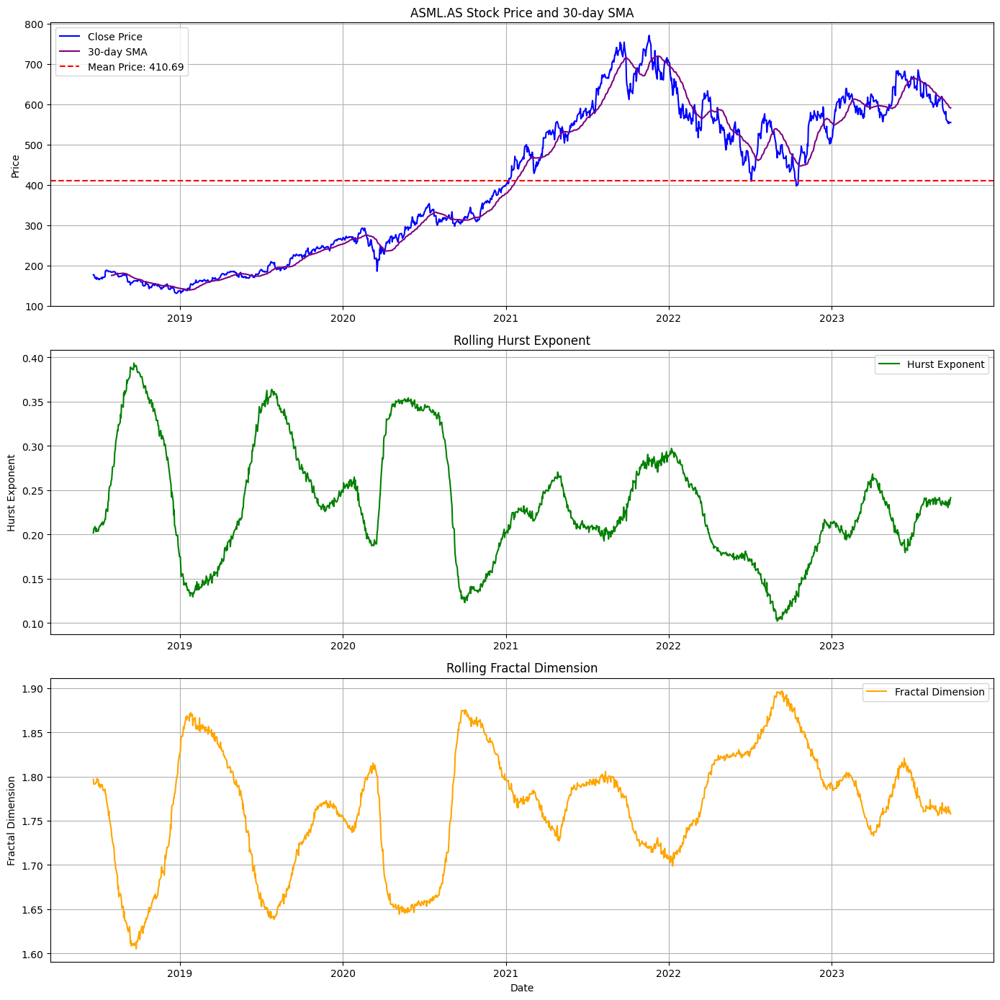

In [17]:
# Essential Libraries Import
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# Function to calculate Hurst Exponent and Fractal Dimension
def hurst_fd(price_series, min_window=10, max_window=100, num_windows=20, num_samples=100):
    # Calculate logarithmic returns
    log_returns = np.diff(np.log(price_series))

    # Define window sizes for the resampling approach
    window_sizes = np.linspace(min_window, max_window, num_windows, dtype=int)
    R_S = []

    # For each window size, calculate R/S values
    for w in window_sizes:
        R, S = [], []

        # Resample multiple sequences for a more robust estimate
        for _ in range(num_samples):
            start = np.random.randint(0, len(log_returns) - w)
            seq = log_returns[start:start + w]
            R.append(np.max(seq) - np.min(seq))
            S.append(np.std(seq))

        R_S.append(np.mean(R) / np.mean(S))

    # Calculate the slope (Hurst Exponent) in a log-log plot
    log_window_sizes = np.log(window_sizes)
    log_R_S = np.log(R_S)
    coeffs = np.polyfit(log_window_sizes, log_R_S, 1)

    # Extract Hurst Exponent and derive Fractal Dimension
    hurst_exponent = coeffs[0]
    fractal_dimension = 2 - hurst_exponent

    return hurst_exponent, fractal_dimension

# Function to calculate rolling Hurst Exponent
def rolling_hurst(price_series, window, min_window=10, max_window=100, num_windows=20, num_samples=100):
    return price_series.rolling(window=window).apply(lambda x: hurst_fd(x, min_window, max_window, num_windows, num_samples)[0], raw=True)

# Function to calculate rolling Fractal Dimension
def rolling_fractal_dimension(price_series, window, min_window=10, max_window=100, num_windows=20, num_samples=100):
    return price_series.rolling(window=window).apply(lambda x: hurst_fd(x, min_window, max_window, num_windows, num_samples)[1], raw=True)

# Define symbol and fetch its historical data
symbol = "ASML.AS"
start_date = "2018-01-01"
end_date = "2026-12-27"
df = yf.download(symbol, start=start_date, end=end_date)

# Calculate rolling Hurst Exponent and Fractal Dimension for the stock data
rolling_window = 120
df['hurst_exponent'] = rolling_hurst(df['Close'], rolling_window)
df['fractal_dimension'] = rolling_fractal_dimension(df['Close'], rolling_window)
df.dropna(inplace=True)

# Calculate 30-day Simple Moving Average for visualization purposes
sma_window = 30
df['sma'] = df['Close'].rolling(window=sma_window).mean()

# Calculate mean price for visualization purposes
mean_price = df['Close'].mean()

# Set up the figure
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 14))

# First subplot: Closing Price, 30-day SMA, and Mean Price
axes[0].plot(df.index, df['Close'], color='blue', label='Close Price')
axes[0].plot(df.index, df['sma'], color='purple', label='30-day SMA')
axes[0].axhline(y=mean_price, color='red', linestyle='--', label=f'Mean Price: {mean_price:.2f}')
axes[0].set_ylabel('Price')
axes[0].legend(loc='upper left')
axes[0].set_title(f'{symbol} Stock Price and 30-day SMA')
axes[0].grid(True)

# Second subplot: Rolling Hurst Exponent
axes[1].plot(df.index, df['hurst_exponent'], color='green', label='Hurst Exponent')
axes[1].set_ylabel('Hurst Exponent')
axes[1].legend(loc='upper right')
axes[1].set_title('Rolling Hurst Exponent')
axes[1].grid(True)

# Third subplot: Rolling Fractal Dimension
axes[2].plot(df.index, df['fractal_dimension'], color='orange', label='Fractal Dimension')
axes[2].set_ylabel('Fractal Dimension')
axes[2].set_xlabel('Date')
axes[2].legend(loc='upper right')
axes[2].set_title('Rolling Fractal Dimension')
axes[2].grid(True)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

<ipython-input-18-3e0dfcda1ee8>:14: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


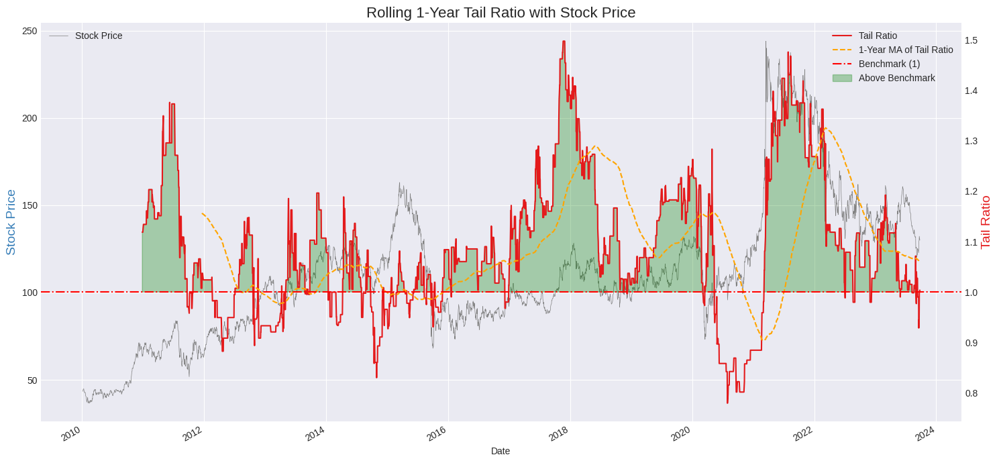

In [18]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()
tail_ratio = tickerDf['returns'].rolling(252).apply(lambda x: np.abs(np.percentile(x, 95)) / np.abs(np.percentile(x, 5))).dropna()

# Aesthetics
plt.figure(figsize=(15,7))
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

# Plot stock price
ax1 = plt.gca()
tickerDf['Close'].plot(ax=ax1, color='gray', linewidth=0.5, label='Stock Price')
ax1.set_ylabel('Stock Price', fontsize=14, color=palette(1))
ax1.legend(loc='upper left')

# Plot tail ratio
ax2 = ax1.twinx()
ax2.plot(tail_ratio.index, tail_ratio, color=palette(0), linewidth=1.5, label='Tail Ratio')

# Plotting a simple moving average of the tail ratio
ax2.plot(tail_ratio.index, tail_ratio.rolling(window=252).mean(), color='orange', linestyle='--', label='1-Year MA of Tail Ratio')

# Horizontal line for benchmark tail ratio of 1
ax2.axhline(y=1, color='red', linestyle='-.', label='Benchmark (1)')

# Shade region where tail ratio is above 1
ax2.fill_between(tail_ratio.index, tail_ratio, 1, where=(tail_ratio > 1), color='green', alpha=0.3, label='Above Benchmark')

# Aesthetics for the tail ratio plot
ax2.set_ylabel('Tail Ratio', fontsize=14, color=palette(0))
ax2.legend(loc='upper right')
plt.title('Rolling 1-Year Tail Ratio with Stock Price', fontsize=16)
ax2.grid(False)  # Turn off grid for the second axis

plt.tight_layout()
plt.show()

<ipython-input-19-2c7a4f4b2292>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


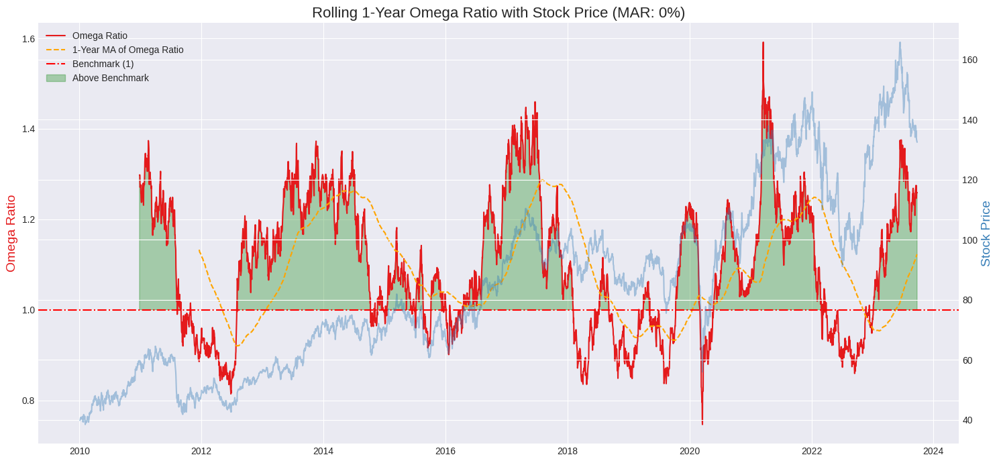

In [19]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

tickerSymbol = "SIE.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()
MAR = 0  # Minimum Acceptable Return
omega_ratio = tickerDf['returns'].rolling(252).apply(lambda x: np.sum(x[x > MAR] - MAR) / np.sum(MAR - x[x < MAR])).dropna()

# Aesthetics
plt.figure(figsize=(15,7))
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

# Plot Omega Ratio
ax1 = plt.gca()
ax1.plot(omega_ratio.index, omega_ratio, color=palette(0), linewidth=1.5, label='Omega Ratio')

# Plotting a simple moving average of the omega ratio
ax1.plot(omega_ratio.index, omega_ratio.rolling(window=252).mean(), color='orange', linestyle='--', label='1-Year MA of Omega Ratio')

# Horizontal line for benchmark Omega Ratio of 1
ax1.axhline(y=1, color='red', linestyle='-.', label='Benchmark (1)')

# Shade region where Omega Ratio is above 1
ax1.fill_between(omega_ratio.index, omega_ratio, 1, where=(omega_ratio > 1), color='green', alpha=0.3, label='Above Benchmark')

# Aesthetics for Omega Ratio
ax1.set_ylabel('Omega Ratio', fontsize=14, color=palette(0))
ax1.legend(loc='upper left')
ax1.set_title(f'Rolling 1-Year Omega Ratio with Stock Price (MAR: {MAR*100}%)', fontsize=16)

# Stock Price Plot on secondary y-axis
ax2 = ax1.twinx()
ax2.plot(tickerDf.index, tickerDf['Close'], color=palette(1), alpha=0.4, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14, color=palette(1))

plt.tight_layout()
plt.show()

<ipython-input-20-651ac5f22230>:18: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


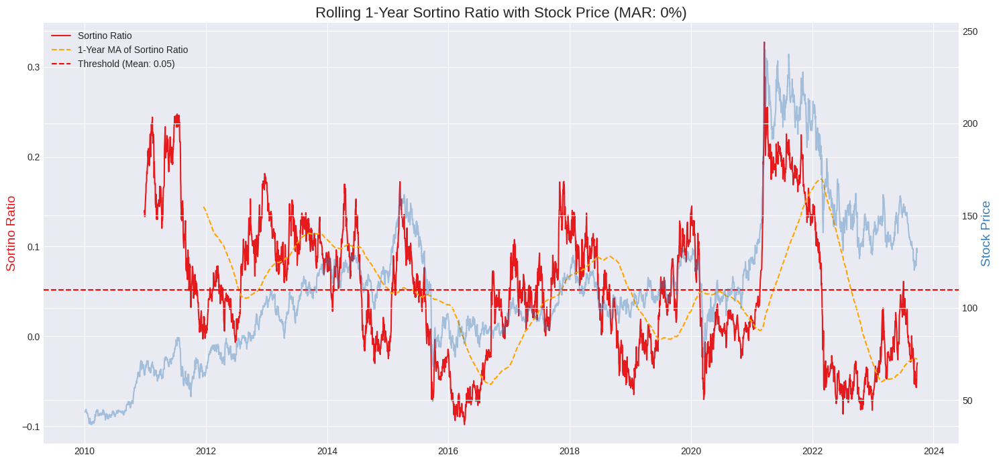

In [20]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

# Fetch Data
tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()
MAR = 0  # Minimum Acceptable Return
sortino_ratio = tickerDf['returns'].rolling(252).apply(lambda x: np.mean(x - MAR) / np.sqrt(np.mean(np.minimum(0, x - MAR) ** 2))).dropna()

threshold = sortino_ratio.mean()

# Aesthetics
plt.figure(figsize=(15,7))
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

# Plot Sortino Ratio
ax1 = plt.gca()
ax1.plot(sortino_ratio.index, sortino_ratio, color=palette(0), linewidth=1.5, label='Sortino Ratio')
# Smoothened Sortino Ratio with a moving average
ax1.plot(sortino_ratio.index, sortino_ratio.rolling(window=252).mean(), color='orange', linestyle='--', label='1-Year MA of Sortino Ratio')
ax1.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold (Mean: {threshold:.2f})')

# Aesthetics for Sortino Ratio
ax1.set_ylabel('Sortino Ratio', fontsize=14, color=palette(0))
ax1.legend(loc='upper left')
ax1.set_title(f'Rolling 1-Year Sortino Ratio with Stock Price (MAR: {MAR*100}%)', fontsize=16)

# Stock Price Plot on secondary y-axis
ax2 = ax1.twinx()
ax2.plot(tickerDf.index, tickerDf['Close'], color=palette(1), alpha=0.4, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14, color=palette(1))

plt.tight_layout()
plt.show()

<ipython-input-21-1c253b184a6a>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


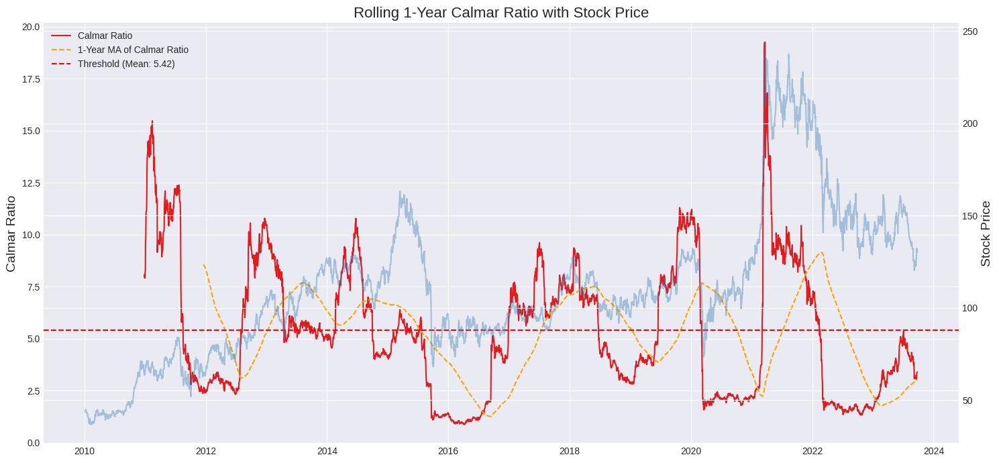

In [21]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

calmar_ratio = tickerDf['returns'].rolling(252).apply(lambda x: (1 + x).cumprod()[-1] ** (252.0 / len(x)) / np.abs(np.min((1 + x).cumprod() / (1 + x).cumprod().cummax()) - 1)).dropna()
threshold_calmar = calmar_ratio.mean()

plt.figure(figsize=(15,7))
plt.style.use('seaborn-darkgrid')
palette = plt.get_cmap('Set1')

ax1 = plt.gca()
ax1.plot(calmar_ratio.index, calmar_ratio, color=palette(0), linewidth=1.5, label='Calmar Ratio')
ax1.plot(calmar_ratio.index, calmar_ratio.rolling(window=252).mean(), color='orange', linestyle='--', label='1-Year MA of Calmar Ratio')
ax1.axhline(y=threshold_calmar, color='red', linestyle='--', label=f'Threshold (Mean: {threshold_calmar:.2f})')
ax1.set_title('Rolling 1-Year Calmar Ratio with Stock Price', fontsize=16)
ax1.set_ylabel('Calmar Ratio', fontsize=14)
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(tickerDf.index, tickerDf['Close'], color=palette(1), alpha=0.4, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14)

plt.tight_layout()
plt.show()

<ipython-input-22-92401d84a668>:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


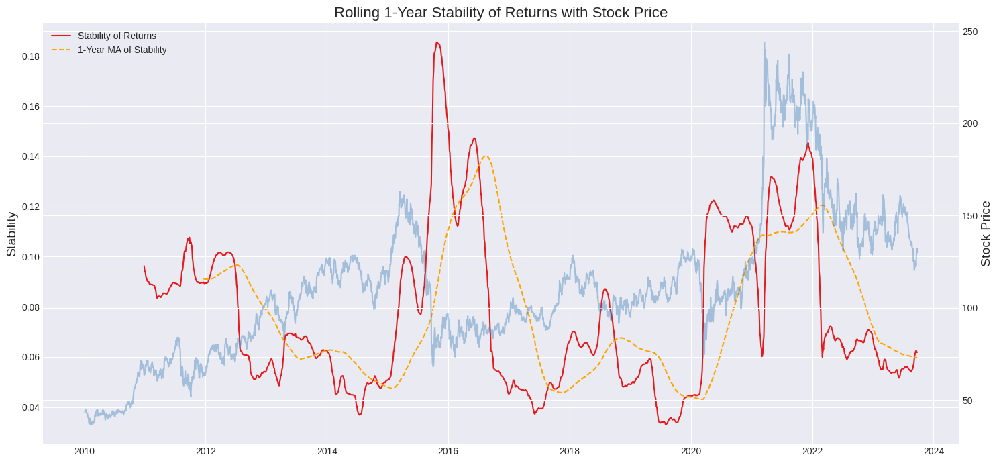

In [22]:
from scipy.stats import linregress

tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

stability = tickerDf['returns'].rolling(252).apply(lambda x: np.std(np.log1p(x).cumsum() - linregress(np.arange(len(x)), np.log1p(x).cumsum()).intercept - linregress(np.arange(len(x)), np.log1p(x).cumsum()).slope * np.arange(len(x)))).dropna()

plt.figure(figsize=(15,7))
plt.style.use('seaborn-darkgrid')

ax1 = plt.gca()
ax1.plot(stability.index, stability, color=palette(0), linewidth=1.5, label='Stability of Returns')
ax1.plot(stability.index, stability.rolling(window=252).mean(), color='orange', linestyle='--', label='1-Year MA of Stability')
ax1.set_title('Rolling 1-Year Stability of Returns with Stock Price', fontsize=16)
ax1.set_ylabel('Stability', fontsize=14)
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(tickerDf.index, tickerDf['Close'], color=palette(1), alpha=0.4, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14)

plt.tight_layout()
plt.show()

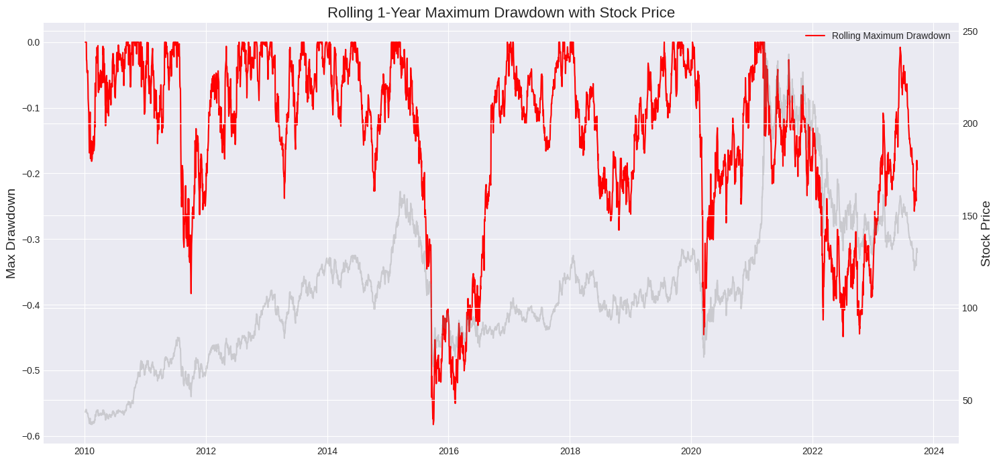

In [23]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

rolling_cumulative = (1 + tickerDf['returns']).cumprod()
rolling_max = rolling_cumulative.rolling(252, min_periods=1).max()
rolling_drawdown = (rolling_cumulative - rolling_max) / rolling_max

plt.figure(figsize=(15,7))
ax1 = plt.gca()
ax1.plot(rolling_drawdown, label='Rolling Maximum Drawdown', linewidth=1.5, color='red')
ax1.set_title('Rolling 1-Year Maximum Drawdown with Stock Price', fontsize=16)
ax1.set_ylabel('Max Drawdown', fontsize=14)
ax1.legend()

ax2 = ax1.twinx()
ax2.plot(tickerDf['Close'], color='grey', alpha=0.3, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14)

plt.tight_layout()
plt.show()


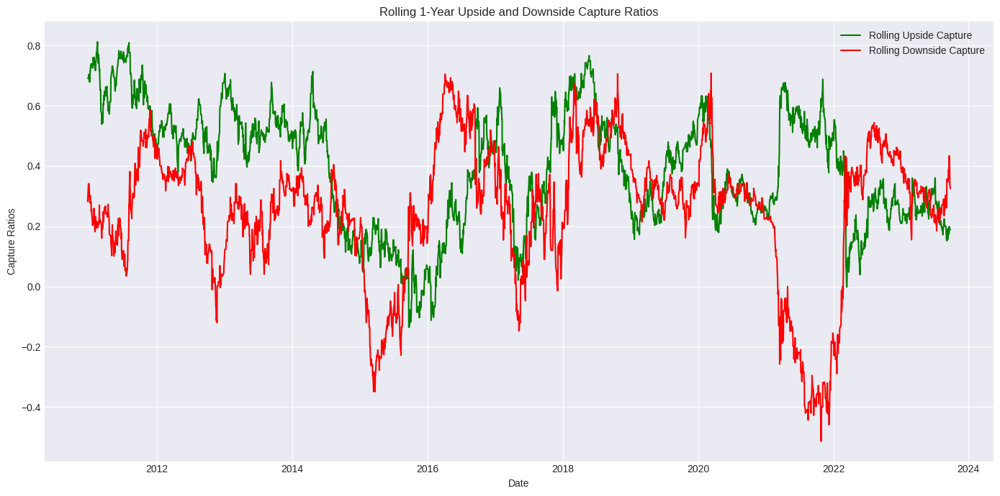

In [24]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

# Fetch data
tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

# Market data for benchmark
market_data = yf.Ticker("^GSPC").history(period='1d', start='2010-1-1')
market_data['returns'] = market_data['Close'].pct_change()

# Align indices
market_data = market_data.reindex(tickerDf.index, method='ffill')

window_size = 252

def calculate_capture(stock_returns, market_returns, is_upside=True):
    relevant_returns = stock_returns[market_returns > 0] if is_upside else stock_returns[market_returns < 0]
    relevant_market_returns = market_returns[market_returns > 0] if is_upside else market_returns[market_returns < 0]
    return relevant_returns.sum() / relevant_market_returns.sum()

def compute_rolling_captures(stock_returns, market_returns, window):
    upside_captures = []
    downside_captures = []

    for idx in range(len(stock_returns) - window + 1):
        current_window_stock = stock_returns.iloc[idx: idx + window]
        current_window_market = market_returns.iloc[idx: idx + window]

        upside = calculate_capture(current_window_stock, current_window_market, is_upside=True)
        downside = calculate_capture(current_window_stock, current_window_market, is_upside=False)

        upside_captures.append(upside)
        downside_captures.append(downside)

    # Padding the initial values with NaNs to make the length equal to original data
    nan_padding = [np.nan] * (window - 1)
    upside_captures = nan_padding + upside_captures
    downside_captures = nan_padding + downside_captures

    return upside_captures, downside_captures

tickerDf['rolling_upside_capture'], tickerDf['rolling_downside_capture'] = compute_rolling_captures(
    tickerDf['returns'], market_data['returns'], window_size
)

plt.figure(figsize=(14, 7))
plt.plot(tickerDf['rolling_upside_capture'], label="Rolling Upside Capture", color='g')
plt.plot(tickerDf['rolling_downside_capture'], label="Rolling Downside Capture", color='r')
plt.title('Rolling 1-Year Upside and Downside Capture Ratios')
plt.xlabel('Date')
plt.ylabel('Capture Ratios')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


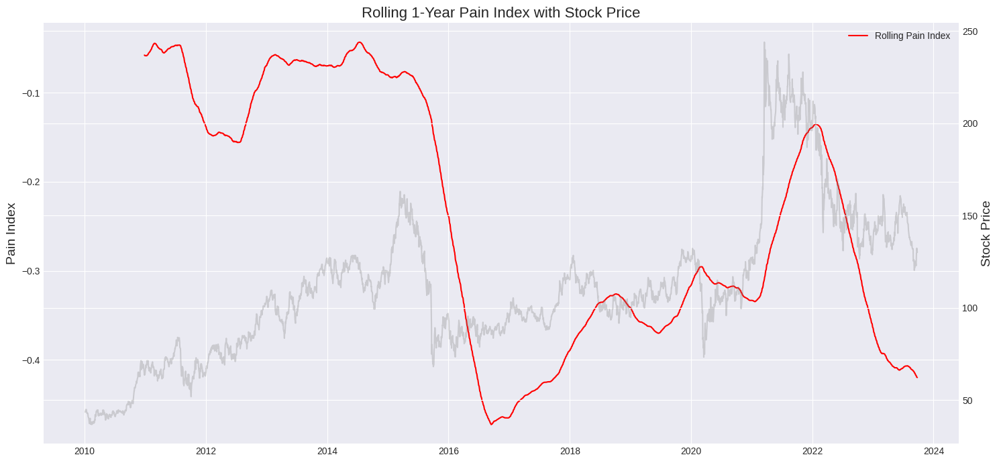

In [25]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

# Fetch Data
tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

# Compute the running cumulative return
cumulative_return = (1 + tickerDf['returns']).cumprod()

# Compute the running maximum
running_max = cumulative_return.cummax()

# Calculate drawdown at each point in time
drawdown = (cumulative_return - running_max) / running_max

# Calculate Pain Index
pain_index = drawdown.rolling(252).apply(lambda x: np.mean(x[x < 0])).dropna()

# Plot
plt.figure(figsize=(15,7))
ax1 = plt.gca()
ax1.plot(pain_index, label='Rolling Pain Index', linewidth=1.5, color='red')
ax1.set_title('Rolling 1-Year Pain Index with Stock Price', fontsize=16)
ax1.set_ylabel('Pain Index', fontsize=14)
ax1.legend()

ax2 = ax1.twinx()
ax2.plot(tickerDf['Close'], color='grey', alpha=0.3, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14)

plt.tight_layout()
plt.show()

[*********************100%%**********************]  46 of 46 completed


<ipython-input-30-d63739ee59ed>:77: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for date, value in returns[ticker].iteritems():


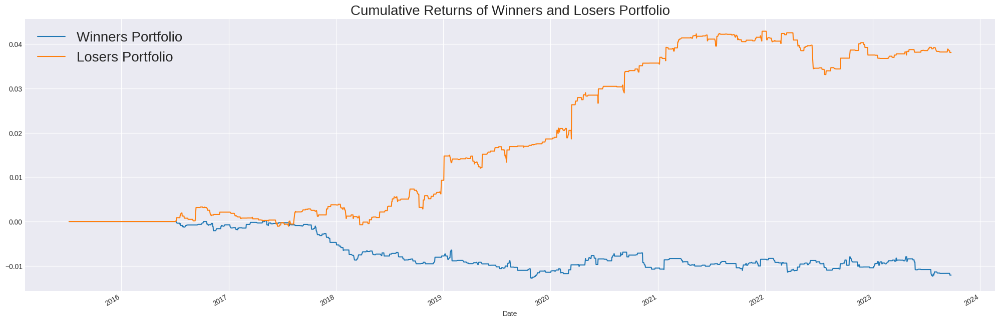

In [30]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

tickers = [
    'AAPL',  # Apple Inc.
    'MSFT',  # Microsoft Corp.
    'GOOGL', # Alphabet Inc. (Google)
    'AMZN',  # Amazon.com Inc.
    'META',  # META Inc.
    'TSLA',  # Tesla Inc.
    'BRK-B', # Berkshire Hathaway Inc.
    'NVDA',  # NVIDIA Corp.
    'JPM',   # JPMorgan Chase & Co.
    'JNJ',   # Johnson & Johnson
    'V',     # Visa Inc.
    'PG',    # Procter & Gamble Co.
    'UNH',   # UnitedHealth Group Inc.
    'MA',    # Mastercard Inc.
    'DIS',   # Walt Disney Co.
    'HD',    # Home Depot Inc.
    'BAC',   # Bank of America Corp.
    'VZ',    # Verizon Communications Inc.
    'PYPL',  # PayPal Holdings Inc.
    'ADBE',  # Adobe Inc.
    'CMCSA', # Comcast Corp.
    'NFLX',  # Netflix Inc.
    'KO',    # Coca-Cola Co.
    'NKE',   # Nike Inc.
    'MRK',   # Merck & Co Inc.
    'PFE',   # Pfizer Inc.
    'WMT',   # Walmart Inc.
    'T',     # AT&T Inc.
    'PEP',   # PepsiCo Inc.
    'INTC',  # Intel Corp.
    'CSCO',  # Cisco Systems Inc.
    'COST',  # Costco Wholesale Corp.
    'ABBV',  # AbbVie Inc.
    'NEE',   # NextEra Energy Inc.
    'MDT',   # Medtronic Plc.
    'TXN',   # Texas Instruments Inc.
    'GE',    # General Electric Co.
    'ACN',   # Accenture Plc.
    'QCOM',  # Qualcomm Inc.
    'LLY',   # Eli Lilly and Co.
    'MCD',   # McDonald's Corp.
    'DHR',   # Danaher Corp.
    'AVGO',  # Broadcom Inc.
    'LIN',   # Linde Plc.
    'CRM',   # Salesforce.com Inc.
    'BA'     # Boeing Co.
]

# Fetch data
data = yf.download(tickers, start="2010-01-01", end="2024-01-01")['Adj Close']
returns = data.pct_change().dropna()


# Calculate z-scores with a 252-day rolling window
mean = returns.rolling(window=252).mean()
std = returns.rolling(window=252).std()
z_scores = (returns - mean) / std

buy_signals = z_scores < -1.5
sell_signals = z_scores > 1.5

holding_period = 60

# Portfolios to hold our positions
winners_portfolio = pd.DataFrame(index=returns.index, columns=returns.columns).fillna(0.0)
losers_portfolio = pd.DataFrame(index=returns.index, columns=returns.columns).fillna(0.0)

for ticker in tickers:
    position = 0  # -1 for short, 0 for neutral, 1 for long
    days_held = 0

    for date, value in returns[ticker].iteritems():
        if days_held > 0:
            days_held -= 1
            if days_held == 0:
                position = 0

        if buy_signals[ticker][date] and position == 0:
            losers_portfolio.at[date, ticker] = 1
            position = 1
            days_held = holding_period

        elif sell_signals[ticker][date] and position == 0:
            winners_portfolio.at[date, ticker] = -1
            position = -1
            days_held = holding_period

# Daily Portfolio Returns
winners_returns = winners_portfolio.shift(1) * returns
losers_returns = losers_portfolio.shift(1) * returns

# Cumulative Portfolio Returns
cumulative_winners_returns = (1 + winners_returns).cumprod().mean(axis=1) - 1
cumulative_losers_returns = (1 + losers_returns).cumprod().mean(axis=1) - 1

# Plotting
plt.figure(figsize=(25, 8))
cumulative_winners_returns.plot(label="Winners Portfolio")
cumulative_losers_returns.plot(label="Losers Portfolio")
plt.title("Cumulative Returns of Winners and Losers Portfolio", fontsize = 20)
plt.legend(fontsize = 20)
plt.show()

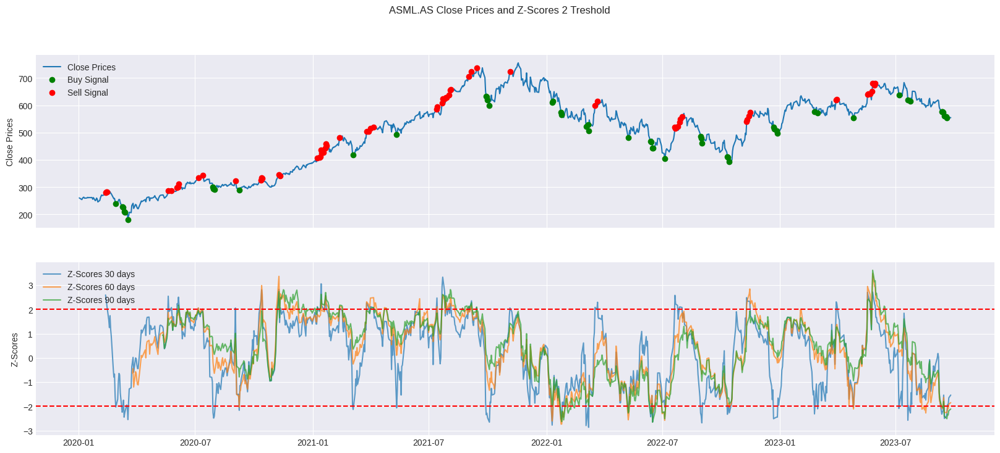

In [31]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Constants
Z_THRESH = 2
PERIODS = [30, 60, 90]
TICKER_SYMBOL = "ASML.AS"
START_DATE = '2020-1-1'
END_DATE = '2023-12-25'


def fetch_data(ticker_symbol, start_date, end_date):
    """Fetches historical data for a given ticker symbol."""
    ticker_data = yf.Ticker(ticker_symbol)
    return ticker_data.history(period='1d', start=start_date, end=end_date)

def calculate_z_scores(close_prices, periods):
    """Calculates Z-scores for given periods."""
    z_scores_dict = {}
    for period in periods:
        # Calculate the rolling mean for the given period
        rolling_mean = close_prices.rolling(window=period).mean()
        # Calculate the rolling standard deviation for the given period
        rolling_std = close_prices.rolling(window=period).std()
        # Compute the Z-scores for the close prices
        z_scores = (close_prices - rolling_mean) / rolling_std
        # Store the Z-scores in the dictionary with the period as the key
        z_scores_dict[period] = z_scores
    return z_scores_dict

def plot_data(close_prices, z_scores_data):
    """Plots close prices and z-scores."""

    # Create subplots for close prices and Z-scores
    fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize=(20, 8))

    # Plot the close prices on the first subplot
    ax1.plot(close_prices.index, close_prices, label='Close Prices')
    for period, z_scores in z_scores_data.items():
        # Plot the Z-scores on the second subplot for each period
        ax2.plot(z_scores.index, z_scores, label=f'Z-Scores {period} days', alpha=0.7)
        # If the period is the first in the list, plot buy/sell signals on the first subplot
        if period == PERIODS[0]:
            buy_signals = (z_scores < -Z_THRESH)
            sell_signals = (z_scores > Z_THRESH)
            ax1.plot(close_prices[buy_signals].index, close_prices[buy_signals], 'o', color='g', label='Buy Signal')
            ax1.plot(close_prices[sell_signals].index, close_prices[sell_signals], 'o', color='r', label='Sell Signal')
    # Set the y-label and legend for the close prices subplot
    ax1.set_ylabel('Close Prices')
    ax1.legend(loc="upper left")
    ax1.grid(True)

    # Draw horizontal lines indicating the Z-score thresholds on the Z-scores subplot
    ax2.axhline(-Z_THRESH, color='red', linestyle='--')
    ax2.axhline(Z_THRESH, color='red', linestyle='--')
    # Set the y-label and legend for the Z-scores subplot
    ax2.set_ylabel('Z-Scores')
    ax2.legend(loc="upper left")
    ax2.grid(True)

    # Set the main title for the entire plot
    plt.suptitle(f'{TICKER_SYMBOL} Close Prices and Z-Scores {Z_THRESH} Treshold')
    # Display the plots
    plt.show()

# Fetch the historical data for the ticker symbol
ticker_data = fetch_data(TICKER_SYMBOL, START_DATE, END_DATE)

# Calculate Z-scores for the specified periods
z_scores_data = calculate_z_scores(ticker_data['Close'], PERIODS)

# Plot the close prices and Z-scores
plot_data(ticker_data['Close'], z_scores_data)

[*********************100%%**********************]  1 of 1 completed
Rips(maxdim=2, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


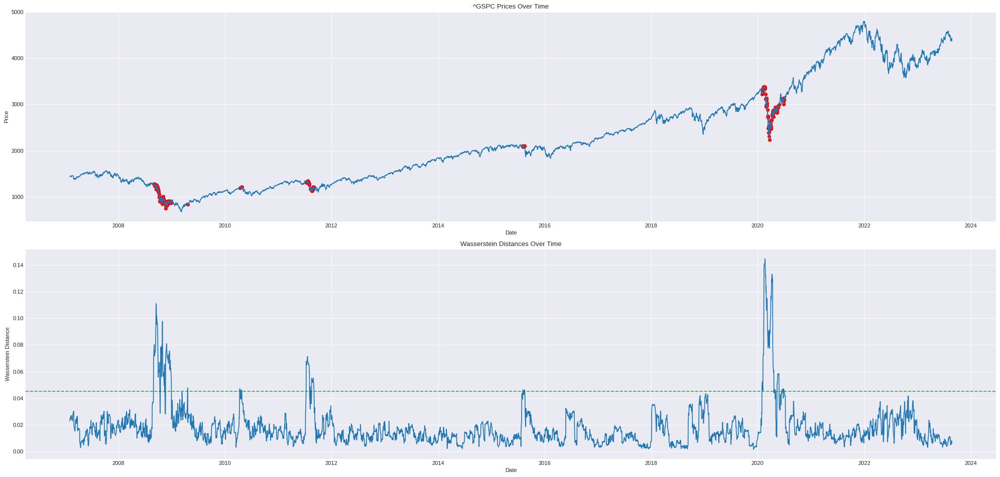

In [34]:
import yfinance as yf
import numpy as np
from ripser import Rips
import persim
import matplotlib.pyplot as plt
import warnings

def fetch_data(ticker_name, start_date, end_date):
    """Fetch stock data from Yahoo Finance."""
    raw_data = yf.download(ticker_name, start=start_date, end=end_date)
    adjusted_close = raw_data['Adj Close'].dropna()
    prices = adjusted_close.values
    log_returns = np.log(prices[1:] / prices[:-1])
    return adjusted_close, log_returns

def compute_wasserstein_distances(log_returns, window_size, rips):
    """Compute the Wasserstein distances."""
    n = len(log_returns) - (2 * window_size) + 1
    distances = np.full((n, 1), np.nan)  # Using np.full with NaN values

    for i in range(n):
        segment1 = log_returns[i:i+window_size].reshape(-1, 1)
        segment2 = log_returns[i+window_size:i+(2*window_size)].reshape(-1, 1)

        if segment1.shape[0] != window_size or segment2.shape[0] != window_size:
            continue

        dgm1 = rips.fit_transform(segment1)
        dgm2 = rips.fit_transform(segment2)
        distance = persim.wasserstein(dgm1[0], dgm2[0], matching=False)
        distances[i] = distance

    return distances

def plot_data(prices, distances, threshold, window_size):
    """Generate the plots."""
    dates = prices.index[window_size:-window_size]
    valid_indices = ~np.isnan(distances)
    valid_dates = dates[valid_indices.flatten()]
    valid_distances = distances[valid_indices]

    alert_indices = [i for i, d in enumerate(valid_distances) if d > threshold]
    alert_dates = [valid_dates[i] for i in alert_indices]
    alert_values = [prices.iloc[i + window_size] for i in alert_indices]

    fig, ax = plt.subplots(2, 1, figsize=(25, 12), dpi=80)

    ax[0].plot(valid_dates, prices.iloc[window_size:-window_size], label=ticker_name)
    ax[0].scatter(alert_dates, alert_values, color='r', s=30)
    ax[0].set_title(f'{ticker_name} Prices Over Time')
    ax[0].set_ylabel('Price')
    ax[0].set_xlabel('Date')

    ax[1].plot(valid_dates, valid_distances)
    ax[1].set_title('Wasserstein Distances Over Time')
    ax[1].set_ylabel('Wasserstein Distance')
    ax[1].axhline(threshold, color='g', linestyle='--', alpha=0.7)
    ax[1].set_xlabel('Date')

    plt.tight_layout()
    plt.show()

# Configuration
ticker_name = '^GSPC' # SP500
start_date_string = "2007-01-01"
end_date_string = "2024-04-21"
window_size = 20
threshold = 0.045

warnings.filterwarnings('ignore')
prices, log_returns = fetch_data(ticker_name, start_date_string, end_date_string)
rips = Rips(maxdim=2)
wasserstein_dists = compute_wasserstein_distances(log_returns, window_size, rips)
plot_data(prices, wasserstein_dists, threshold, window_size)

[*********************100%%**********************]  1 of 1 completed


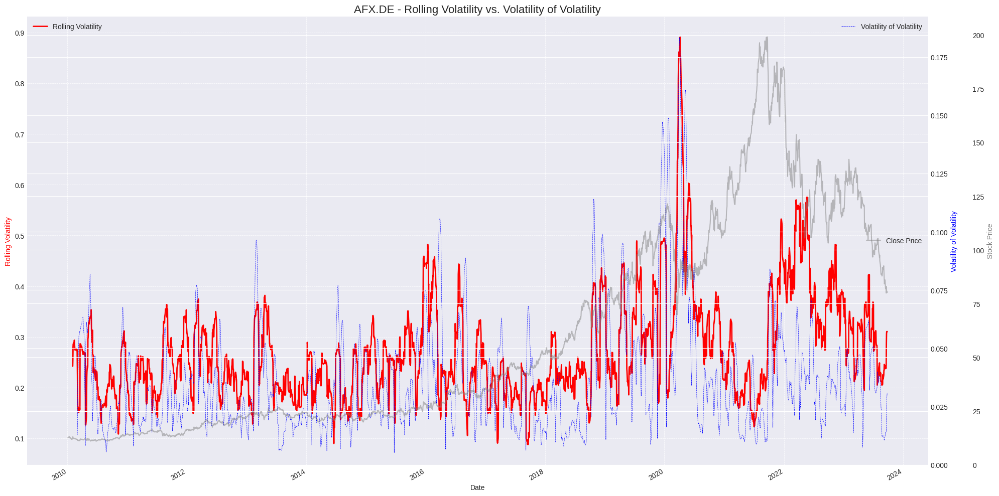

In [35]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the ticker
ticker = "AFX.DE"

# Download the data
data = yf.download(ticker, start='2010-01-01', end='2023-12-21')

# Calculate the daily returns
data['Return'] = data['Close'].pct_change()

# Calculate the rolling volatility (21-day window)
data['Rolling_Volatility'] = data['Return'].rolling(window=21).std() * np.sqrt(252)

# Calculate the volatility of volatility
data['Vol_of_Vol'] = data['Rolling_Volatility'].rolling(window=21).std()

# Create a new figure with a specific size
plt.figure(figsize=(20, 10))

# Create primary axis
ax1 = data['Rolling_Volatility'].plot(label='Rolling Volatility', color='red', linewidth=2)
ax1.set_ylabel('Rolling Volatility', color='red')
ax1.set_title(f'{ticker} - Rolling Volatility vs. Volatility of Volatility', fontsize=16)
ax1.grid(True, which='both', linestyle='--', linewidth=0.5)

# Create secondary axis for Vol of Vol
ax2 = ax1.twinx()
data['Vol_of_Vol'].plot(ax=ax2, label='Volatility of Volatility', color='blue', linestyle='--', linewidth=0.5)
ax2.set_ylabel('Volatility of Volatility', color='blue')
ax2.set_ylim(0)

# Create third axis for stock price
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))  # Move the last y-axis spine further to the right
data['Close'].plot(ax=ax3, label='Close Price', color='grey', alpha=0.5)
ax3.set_ylabel('Stock Price', color='grey')
ax3.set_ylim(0)

# Legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax3.legend(loc='center right')

plt.tight_layout()
plt.show()

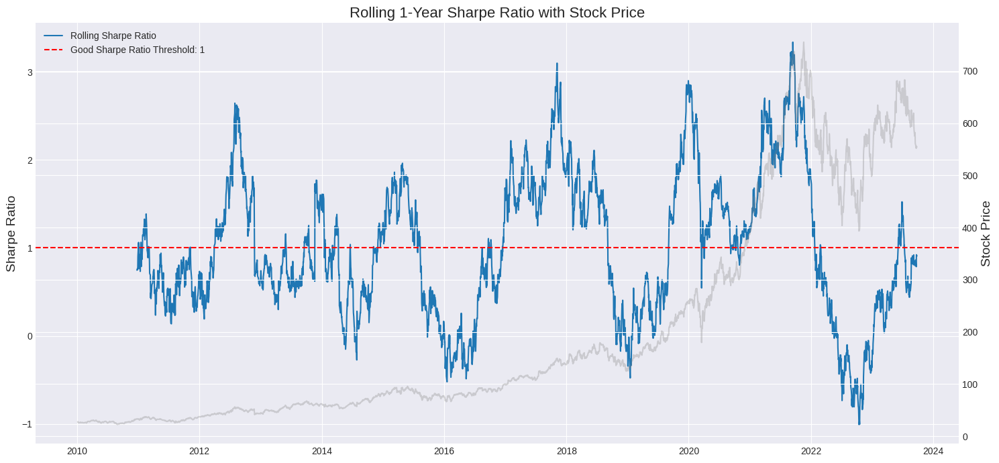

In [36]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

tickerSymbol = "ASML.AS"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

# Annualized Sharpe Ratio
rolling_sharpe = np.sqrt(252) * tickerDf['returns'].rolling(252).mean() / tickerDf['returns'].rolling(252).std()

plt.figure(figsize=(15,7))
ax1 = plt.gca()
ax1.plot(rolling_sharpe, label='Rolling Sharpe Ratio', linewidth=1.5)
ax1.axhline(y=1, color='red', linestyle='--', label='Good Sharpe Ratio Threshold: 1')
ax1.set_title('Rolling 1-Year Sharpe Ratio with Stock Price', fontsize=16)
ax1.set_ylabel('Sharpe Ratio', fontsize=14)
ax1.legend()

ax2 = ax1.twinx()
ax2.plot(tickerDf['Close'], color='grey', alpha=0.3, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14)

plt.tight_layout()
plt.show()

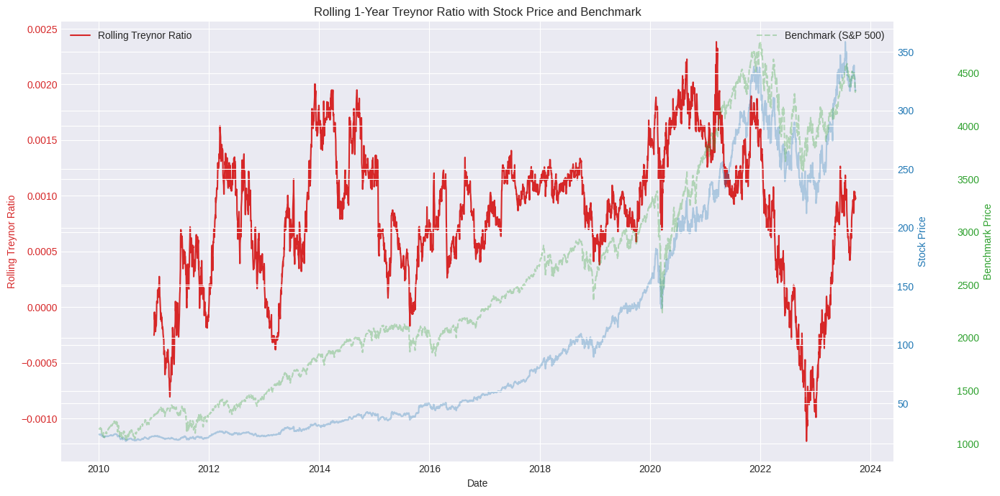

In [37]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

# Fetch data
tickerSymbol = "MSFT"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

# Market data for benchmark (S&P500)
market_data = yf.Ticker("^GSPC").history(period='1d', start='2010-1-1')
market_data['returns'] = market_data['Close'].pct_change()

# Align indices
market_data = market_data.reindex(tickerDf.index, method='ffill')

window_size = 252

# Calculate rolling beta
covariance = tickerDf['returns'].rolling(window=window_size).cov(market_data['returns'])
variance = market_data['returns'].rolling(window=window_size).var()
rolling_beta = covariance/variance

# Calculate rolling Treynor Ratio
risk_free_rate = 0
avg_rolling_returns = tickerDf['returns'].rolling(window=window_size).mean()
tickerDf['rolling_treynor_ratio'] = (avg_rolling_returns - risk_free_rate) / rolling_beta

fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('Rolling Treynor Ratio', color=color)
ax1.plot(tickerDf['rolling_treynor_ratio'], label="Rolling Treynor Ratio", color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(True)
ax1.legend(loc="upper left")

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Stock Price', color=color)
ax2.plot(tickerDf['Close'], label="MSFT Stock Price", color=color, alpha=0.3)
ax2.tick_params(axis='y', labelcolor=color)

ax3 = ax1.twinx()
color = 'tab:green'
# Offset the twin axis to the right
ax3.spines['right'].set_position(('outward', 60))
ax3.set_ylabel('Benchmark Price', color=color)
ax3.plot(market_data['Close'], label="Benchmark (S&P 500)", linestyle="--", color=color, alpha=0.3)
ax3.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax3.legend(loc="upper right")

plt.title('Rolling 1-Year Treynor Ratio with Stock Price and Benchmark')
plt.tight_layout()
plt.show()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


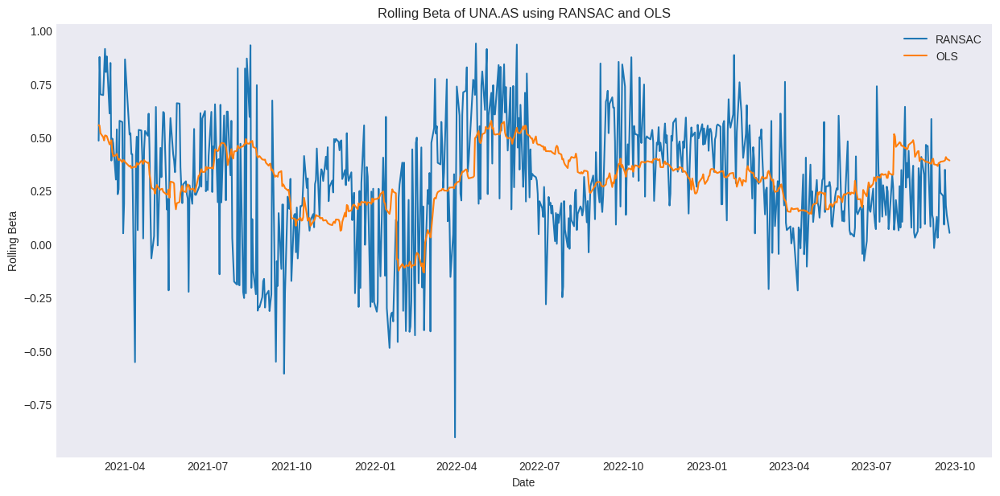

In [38]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor, LinearRegression

# Download historical data for ticker and a market index (e.g., ^AEX)
ticker = "UNA.AS"
start_date = "2016-01-01"
end_date = "2025-09-01"
stock = yf.download(ticker, start=start_date, end=end_date)
market = yf.download("^AEX", start=start_date, end=end_date)

# Calculate daily returns
stock_returns = stock["Adj Close"].pct_change().dropna()
market_returns = market["Adj Close"].pct_change().dropna()

# Align dates and remove rows with missing data
aligned_data = pd.concat([stock_returns, market_returns], axis=1).dropna()
aligned_data.columns = [ticker, "Market"]

# Calculate rolling beta using RANSAC
window = 60  # Choose the length of the rolling window
ransac = RANSACRegressor()
ols = LinearRegression()
rolling_beta_ransac = []
rolling_beta_ols = []

for i in range(len(aligned_data) - window):
    X = aligned_data["Market"].iloc[i:i+window].values.reshape(-1, 1)
    y = aligned_data[ticker].iloc[i:i+window].values

    ransac.fit(X, y)
    beta_ransac = ransac.estimator_.coef_[0]
    rolling_beta_ransac.append(beta_ransac)

    ols.fit(X, y)
    beta_ols = ols.coef_[0]
    rolling_beta_ols.append(beta_ols)

# Plot rolling beta
plt.figure(figsize=(15,7))
plt.plot(aligned_data.index[window:], rolling_beta_ransac, label="RANSAC")
plt.plot(aligned_data.index[window:], rolling_beta_ols, label="OLS")
plt.xlabel("Date")
plt.ylabel("Rolling Beta")
plt.title(f"Rolling Beta of {ticker} using RANSAC and OLS")
plt.legend()
plt.grid()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


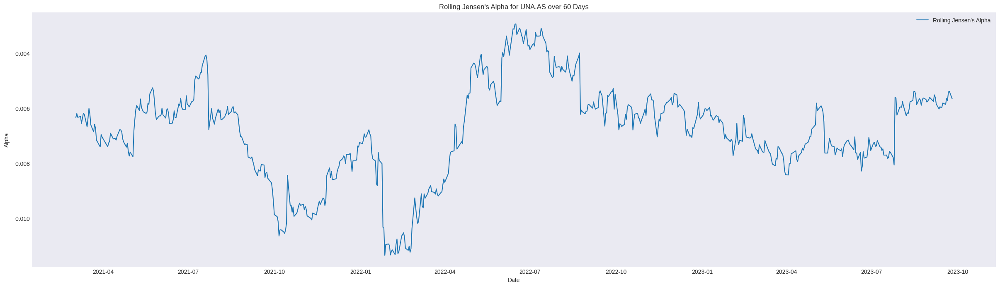

In [39]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Download historical data
start_date = "2016-01-01"
end_date = "2025-09-01"
stock = yf.download("UNA.AS", start=start_date, end=end_date)
market = yf.download("^AEX", start=start_date, end=end_date)

# Calculate daily returns
stock_returns = stock["Adj Close"].pct_change().dropna()
market_returns = market["Adj Close"].pct_change().dropna()

# Align data
aligned_data = pd.concat([stock_returns, market_returns], axis=1).dropna()
aligned_data.columns = ["Stock", "Market"]

window = 60  # rolling window
risk_free_rate = 0.01  # example constant rate, adjust as required

rolling_alpha = []

for i in range(len(aligned_data) - window):
    data_window = aligned_data.iloc[i:i+window]
    beta = data_window.cov().iloc[0, 1] / data_window["Market"].var()
    expected_return = risk_free_rate + beta * (data_window["Market"].mean() - risk_free_rate)
    alpha = data_window["Stock"].mean() - expected_return
    rolling_alpha.append(alpha)

# Plotting
plt.figure(figsize=(30, 8))
plt.plot(aligned_data.index[window:], rolling_alpha, label="Rolling Jensen's Alpha")
plt.xlabel("Date")
plt.ylabel("Alpha")
plt.title(f"Rolling Jensen's Alpha for UNA.AS over {window} Days")
plt.grid()
plt.legend()
plt.show()

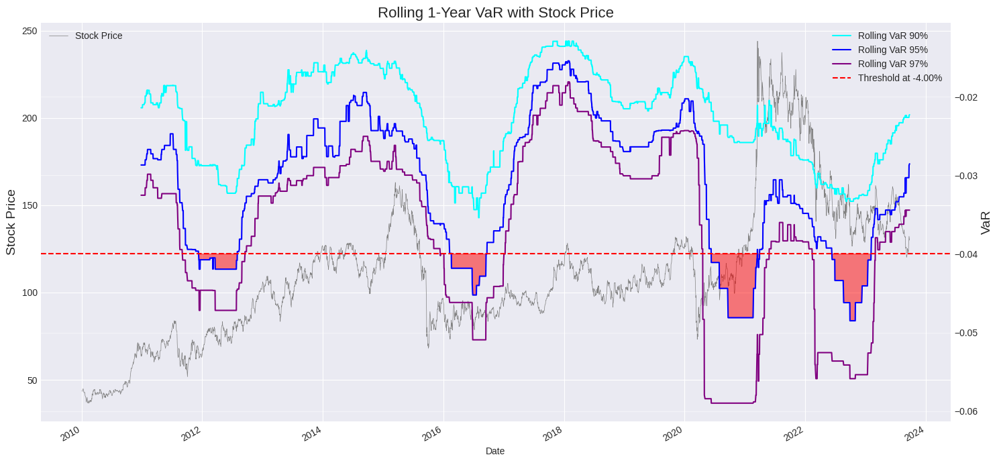

In [40]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt

# Define the ticker symbol
tickerSymbol = "VOW.DE"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

# Calculate VaR for 90%, 95%, and 97% confidence levels
rolling_var_90 = tickerDf['returns'].rolling(252).quantile(0.10).dropna()
rolling_var_95 = tickerDf['returns'].rolling(252).quantile(0.05).dropna()
rolling_var_97 = tickerDf['returns'].rolling(252).quantile(0.03).dropna()

threshold = -0.04  # change this value as needed

plt.figure(figsize=(15,7))

# Plotting stock price
ax1 = plt.gca()
tickerDf['Close'].plot(ax=ax1, color='gray', linewidth=0.5, label='Stock Price')
ax1.set_ylabel('Stock Price', fontsize=14)
ax1.legend(loc='upper left')

# Plotting VaR on secondary y-axis
ax2 = ax1.twinx()
ax2.plot(rolling_var_90.index, rolling_var_90, label='Rolling VaR 90%', color='cyan', linewidth=1.5)
ax2.plot(rolling_var_95.index, rolling_var_95, label='Rolling VaR 95%', color='blue', linewidth=1.5)
ax2.plot(rolling_var_97.index, rolling_var_97, label='Rolling VaR 97%', color='purple', linewidth=1.5)

# Horizontal line to denote the threshold
ax2.axhline(y=threshold, color='red', linestyle='--', label=f'Threshold at {threshold*100:.2f}%')

# Highlight areas below the threshold for 95% VaR
ax2.fill_between(rolling_var_95.index, rolling_var_95, threshold, where=(rolling_var_95 <= threshold), color='red', alpha=0.5)

# Aesthetics
ax2.set_ylabel('VaR', fontsize=14)
ax2.grid(True, alpha=0.5)
ax2.legend(loc='upper right')
plt.title('Rolling 1-Year VaR with Stock Price', fontsize=16)

plt.tight_layout()
plt.show()

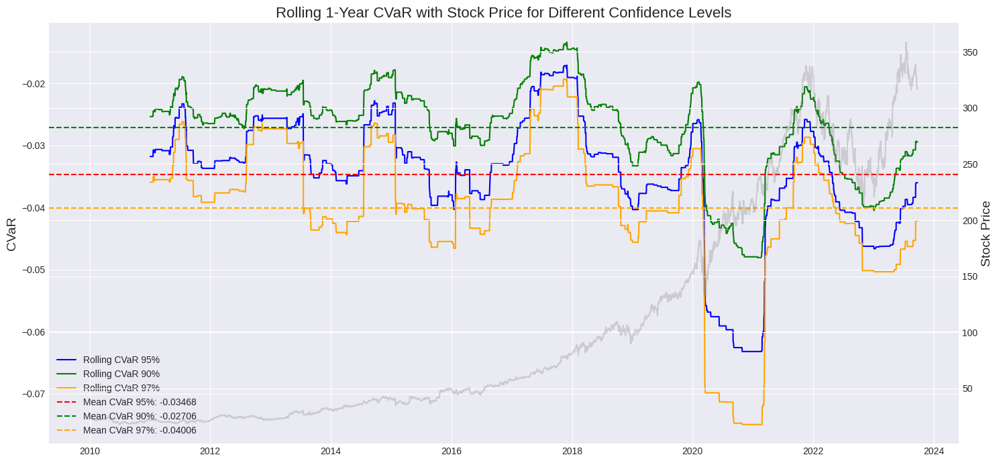

In [41]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')

tickerSymbol = "MSFT"
tickerData = yf.Ticker(tickerSymbol)
tickerDf = tickerData.history(period='1d', start='2010-1-1')
tickerDf['returns'] = tickerDf['Close'].pct_change()

def conditional_var(x, alpha=0.05):
    var = np.percentile(x, alpha * 100)
    return np.mean(x[x < var])

rolling_cvar_95 = tickerDf['returns'].rolling(252).apply(conditional_var, raw=True).dropna()
rolling_cvar_90 = tickerDf['returns'].rolling(252).apply(lambda x: conditional_var(x, alpha=0.1), raw=True).dropna()
rolling_cvar_97 = tickerDf['returns'].rolling(252).apply(lambda x: conditional_var(x, alpha=0.03), raw=True).dropna()

mean_cvar_95 = rolling_cvar_95.mean()
mean_cvar_90 = rolling_cvar_90.mean()
mean_cvar_97 = rolling_cvar_97.mean()

plt.figure(figsize=(15,7))
ax1 = plt.gca()
ax1.plot(rolling_cvar_95, label='Rolling CVaR 95%', linewidth=1.5, color='blue')
ax1.plot(rolling_cvar_90, label='Rolling CVaR 90%', linewidth=1.5, color='green')
ax1.plot(rolling_cvar_97, label='Rolling CVaR 97%', linewidth=1.5, color='orange')
ax1.axhline(y=mean_cvar_95, color='red', linestyle='--', label=f'Mean CVaR 95%: {mean_cvar_95:.5f}')
ax1.axhline(y=mean_cvar_90, color='green', linestyle='--', label=f'Mean CVaR 90%: {mean_cvar_90:.5f}')
ax1.axhline(y=mean_cvar_97, color='orange', linestyle='--', label=f'Mean CVaR 97%: {mean_cvar_97:.5f}')
ax1.set_title('Rolling 1-Year CVaR with Stock Price for Different Confidence Levels', fontsize=16)
ax1.set_ylabel('CVaR', fontsize=14)
ax1.legend()

ax2 = ax1.twinx()
ax2.plot(tickerDf['Close'], color='grey', alpha=0.3, label='Stock Price')
ax2.set_ylabel('Stock Price', fontsize=14)

plt.tight_layout()
plt.show()

[*********************100%%**********************]  1 of 1 completed


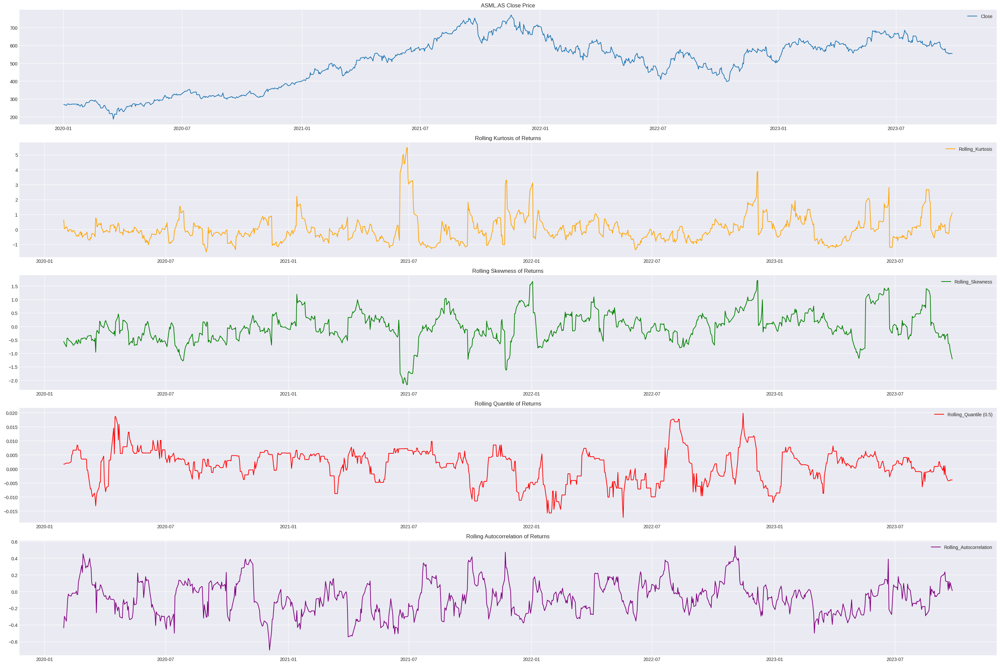

In [42]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import kurtosis, skew

# Load the data
ticker = "ASML.AS"
data = yf.download(ticker, start='2020-01-01', end='2024-09-17')

# Compute daily returns
data['Returns'] = data['Close'].pct_change()

# Calculate rolling window size
window_size = 20

# Calculate rolling kurtosis
data['Rolling_Kurtosis'] = data['Returns'].rolling(window_size).apply(kurtosis)

# Calculate rolling skewness
data['Rolling_Skewness'] = data['Returns'].rolling(window_size).apply(skew)

# Calculate rolling quantiles
quantile_value = 0.5  # adjust this for the quantile you want to calculate
data['Rolling_Quantile'] = data['Returns'].rolling(window_size).quantile(quantile_value)

# Calculate rolling autocorrelation
data['Rolling_Autocorrelation'] = data['Returns'].rolling(window_size).apply(lambda x: x.autocorr())

# Plotting
fig, axes = plt.subplots(5, 1, figsize=(30, 20))

axes[0].plot(data['Close'], label='Close')
axes[0].set_title(f'{ticker} Close Price')
axes[0].legend()

axes[1].plot(data['Rolling_Kurtosis'], label='Rolling_Kurtosis', color='orange')
axes[1].set_title('Rolling Kurtosis of Returns')
axes[1].legend()

axes[2].plot(data['Rolling_Skewness'], label='Rolling_Skewness', color='green')
axes[2].set_title('Rolling Skewness of Returns')
axes[2].legend()

axes[3].plot(data['Rolling_Quantile'], label=f'Rolling_Quantile ({quantile_value})', color='red')
axes[3].set_title('Rolling Quantile of Returns')
axes[3].legend()

axes[4].plot(data['Rolling_Autocorrelation'], label='Rolling_Autocorrelation', color='purple')
axes[4].set_title('Rolling Autocorrelation of Returns')
axes[4].legend()

plt.tight_layout()
plt.show()

[*********************100%%**********************]  4 of 4 completed


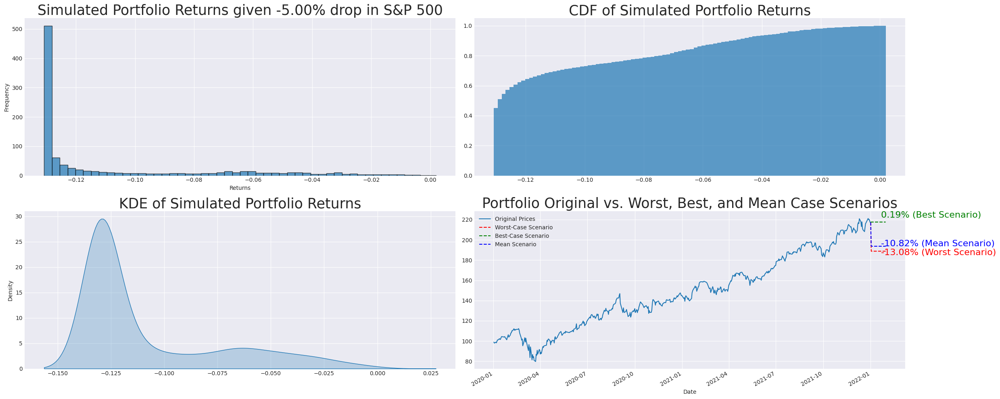

In [45]:
import numpy as np
import pandas as pd
import yfinance as yf
import seaborn as sns
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import norm
import matplotlib.pyplot as plt
from copulae import GaussianCopula

import warnings; warnings.filterwarnings('ignore')

# Define the portfolio
portfolio_tickers = ["MSFT", "AAPL", "GOOGL"]

# 1. Fetch real data
end_date = "2022-01-01"
start_date = "2020-01-01"
symbols = ["^GSPC"] + portfolio_tickers
data = yf.download(symbols, start=start_date, end=end_date)["Adj Close"]
market_drop_percentage = -0.05

# 2. Compute daily returns
returns = data.pct_change().dropna()

# 3. Transform returns to [0,1] range using quantile transformation
quantile_transformers = {}
data_uniform = pd.DataFrame()

for symbol in returns.columns:
    qt = QuantileTransformer(output_distribution='uniform')
    data_uniform[symbol] = qt.fit_transform(returns[[symbol]]).flatten()
    quantile_transformers[symbol] = qt

# Define the function for conditional sampling
def conditional_sample(u1, rho, n_samples=1000):
    u2 = np.linspace(0.001, 0.999, n_samples)
    return u2, norm.cdf((norm.ppf(u1) - rho * norm.ppf(u2)) / np.sqrt(1 - rho**2))

# Simulation for each stock in the portfolio
results = {}
for ticker in portfolio_tickers:
    index_drop = quantile_transformers["^GSPC"].transform(np.array([[market_drop_percentage]]))[0][0]

    # Bivariate assumption with ^GSPC and each stock
    bi_data = data_uniform[["^GSPC", ticker]]
    bi_copula = GaussianCopula(dim=2)
    bi_copula.fit(bi_data.values)
    rho = bi_copula.params[0]

    conditional_u2, conditional_cdf = conditional_sample(index_drop, rho)
    conditional_returns = quantile_transformers[ticker].inverse_transform(conditional_cdf.reshape(-1, 1)).flatten()
    results[ticker] = conditional_returns

'''
# Visualization for each stock in the portfolio
# Comment it out to see the impact to each stock in portfolio
for ticker, conditional_returns in results.items():
    fig, ax = plt.subplots(2, 2, figsize=(25, 10))
    last_known_price = data[ticker].iloc[-1]
    min_return = np.min(conditional_returns)
    max_return = np.max(conditional_returns)
    mean_return = np.mean(conditional_returns)

    final_min_price = last_known_price * (1 + min_return)
    final_max_price = last_known_price * (1 + max_return)
    final_mean_price = last_known_price * (1 + mean_return)

    simulated_dates = pd.date_range(start=data.index[-1], periods=31, freq='D')[1:]

    min_price_trajectory = [last_known_price] + [final_min_price] * (len(simulated_dates) - 1)
    max_price_trajectory = [last_known_price] + [final_max_price] * (len(simulated_dates) - 1)
    mean_price_trajectory = [last_known_price] + [final_mean_price] * (len(simulated_dates) - 1)

    # Plot 1: Histogram of Simulated Returns
    ax[0, 0].hist(conditional_returns, bins=50, edgecolor='k', alpha=0.7)
    ax[0, 0].set_title(f"Simulated {ticker} Returns given 10% drop in S&P 500")
    ax[0, 0].set_xlabel("Returns")
    ax[0, 0].set_ylabel("Frequency")

    # Plot 2: CDF of Simulated Returns
    ax[0, 1].hist(conditional_returns, bins=100, density=True, cumulative=True, alpha=0.7)
    ax[0, 1].set_title('CDF of Simulated Returns')

    # Plot 3: KDE of Simulated Returns
    sns.kdeplot(conditional_returns, shade=True, ax=ax[1, 0])
    ax[1, 0].set_title('KDE of Simulated Returns')

    # Plot 4: Ticker Original vs. Worst, Best, and Mean Case Scenarios
    data[ticker].plot(ax=ax[1, 1], label="Original Prices")
    pd.Series(min_price_trajectory, index=simulated_dates).plot(ax=ax[1, 1], label="Worst-Case Scenario", linestyle='--', color="red")
    pd.Series(max_price_trajectory, index=simulated_dates).plot(ax=ax[1, 1], label="Best-Case Scenario", linestyle='--', color="green")
    pd.Series(mean_price_trajectory, index=simulated_dates).plot(ax=ax[1, 1], label="Mean Scenario", linestyle='--', color="blue")

    label_x_position = simulated_dates[-10]
    ax[1, 1].annotate(f"{min_return*100:.2f}% (Worst Scenario)", (label_x_position, final_min_price * 0.98), fontsize=12, ha="left", color="red")
    ax[1, 1].annotate(f"{max_return*100:.2f}% (Best Scenario)", (label_x_position, final_max_price * 1.02), fontsize=12, ha="left", color="green")
    ax[1, 1].annotate(f"{mean_return*100:.2f}% (Mean Scenario)", (label_x_position, final_mean_price), fontsize=12, ha="left", color="blue")

    ax[1, 1].set_title(f"{ticker} Original vs. Worst, Best and Mean Case Scenarios")
    ax[1, 1].legend()

    plt.tight_layout()
    plt.show()
'''

# Compute portfolio returns from individual stock returns
portfolio_returns = np.mean(np.array([results[ticker] for ticker in portfolio_tickers]), axis=0)

# Visualization for the Portfolio
fig, ax = plt.subplots(2, 2, figsize=(25, 10))
last_known_prices = data[portfolio_tickers].iloc[-1]
portfolio_last_known_price = np.mean(last_known_prices)  # Equally weighted

min_return = np.min(portfolio_returns)
max_return = np.max(portfolio_returns)
mean_return = np.mean(portfolio_returns)

final_min_price = portfolio_last_known_price * (1 + min_return)
final_max_price = portfolio_last_known_price * (1 + max_return)
final_mean_price = portfolio_last_known_price * (1 + mean_return)

simulated_dates = pd.date_range(start=data.index[-1], periods=31, freq='D')[1:]

min_price_trajectory = [portfolio_last_known_price] + [final_min_price] * (len(simulated_dates) - 1)
max_price_trajectory = [portfolio_last_known_price] + [final_max_price] * (len(simulated_dates) - 1)
mean_price_trajectory = [portfolio_last_known_price] + [final_mean_price] * (len(simulated_dates) - 1)

# Plot 1: Histogram of Simulated Returns
ax[0, 0].hist(portfolio_returns, bins=50, edgecolor='k', alpha=0.7)
ax[0, 0].set_title(f"Simulated Portfolio Returns given {market_drop_percentage*100:.2f}% drop in S&P 500", fontsize=25)
ax[0, 0].set_xlabel("Returns")
ax[0, 0].set_ylabel("Frequency")

# Plot 2: CDF of Simulated Returns
ax[0, 1].hist(portfolio_returns, bins=100, density=True, cumulative=True, alpha=0.7)
ax[0, 1].set_title('CDF of Simulated Portfolio Returns', fontsize=25)

# Plot 3: KDE of Simulated Returns
sns.kdeplot(portfolio_returns, shade=True, ax=ax[1, 0])
ax[1, 0].set_title('KDE of Simulated Portfolio Returns', fontsize=25)

# Plot 4: Portfolio Original vs. Worst, Best, and Mean Case Scenarios
portfolio_prices = data[portfolio_tickers].mean(axis=1)
portfolio_prices.plot(ax=ax[1, 1], label="Original Prices")
pd.Series(min_price_trajectory, index=simulated_dates).plot(ax=ax[1, 1], label="Worst-Case Scenario", linestyle='--', color="red")
pd.Series(max_price_trajectory, index=simulated_dates).plot(ax=ax[1, 1], label="Best-Case Scenario", linestyle='--', color="green")
pd.Series(mean_price_trajectory, index=simulated_dates).plot(ax=ax[1, 1], label="Mean Scenario", linestyle='--', color="blue")

label_x_position = simulated_dates[-10]
ax[1, 1].annotate(f"{min_return*100:.2f}% (Worst Scenario)", (label_x_position, final_min_price * 0.98), fontsize=16, ha="left", color="red")
ax[1, 1].annotate(f"{max_return*100:.2f}% (Best Scenario)", (label_x_position, final_max_price * 1.02), fontsize=16, ha="left", color="green")
ax[1, 1].annotate(f"{mean_return*100:.2f}% (Mean Scenario)", (label_x_position, final_mean_price), fontsize=16, ha="left", color="blue")

ax[1, 1].set_title(f"Portfolio Original vs. Worst, Best, and Mean Case Scenarios", fontsize=25)
ax[1, 1].legend()

# General configurations for the plot aesthetics
sns.set_style("whitegrid")
plt.tight_layout()
plt.show()

[*********************100%%**********************]  6 of 6 completed


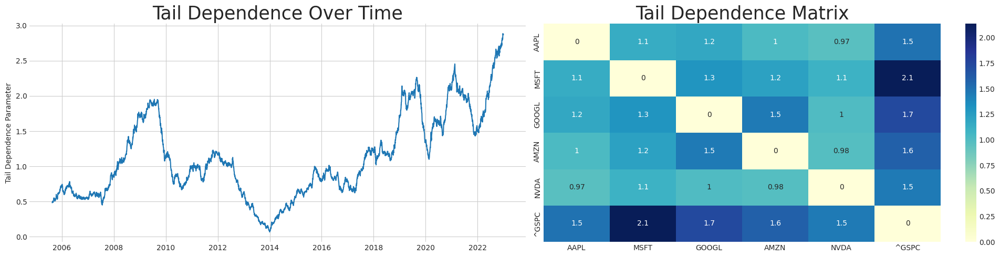

In [48]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import rankdata
from copulas.bivariate import Clayton
import warnings; warnings.filterwarnings('ignore')

# 1. Data Collection:
# Definestock basket
stocks = ["AAPL", "MSFT", "GOOGL", "AMZN", "NVDA", "^GSPC"]
# Fetch data
data = yf.download(stocks, start="2000-01-01", end="2023-01-01")['Adj Close']

# 2. Data Preprocessing:
# Compute daily returns and drop NaN values
returns = data.pct_change().dropna()

# Convert data to uniform using ECDF
def to_uniform(column):
    n = len(column)
    return rankdata(column) / (n + 1)

uniform_data = returns.apply(to_uniform)

# 3. Rolling Time Window Analysis:
# Rolling window analysis
window_size = 250
tail_parameters = []

for start in range(0, len(uniform_data) - window_size):
    window_data = uniform_data.iloc[start:start + window_size]

    copula = Clayton()
    copula.fit(window_data.values)

    # Extract tail parameter (for Clayton, the theta parameter)
    tail_parameters.append(copula.theta)

# 4. Visualization:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))  # 1 row, 2 columns

# Plotting the Tail Dependence Over Time on the first subplot
ax1.plot(returns.index[window_size:], tail_parameters)
ax1.set_title('Tail Dependence Over Time',fontsize=25)
ax1.set_ylabel('Tail Dependence Parameter')

# Constructing the Tail Dependence Matrix
tail_dep_matrix = np.zeros((len(stocks), len(stocks)))
for i in range(len(stocks)):
    for j in range(len(stocks)):
        if i != j:
            copula_ij = Clayton()
            copula_ij.fit(uniform_data[[stocks[i], stocks[j]]].values)
            tail_dep_matrix[i, j] = copula_ij.theta

# Plotting the heatmap on the second subplot
sns.heatmap(tail_dep_matrix, annot=True, cmap='YlGnBu', xticklabels=stocks, yticklabels=stocks, ax=ax2)
ax2.set_title("Tail Dependence Matrix", fontsize=25)

plt.tight_layout()
plt.show()

[*********************100%%**********************]  1 of 1 completed


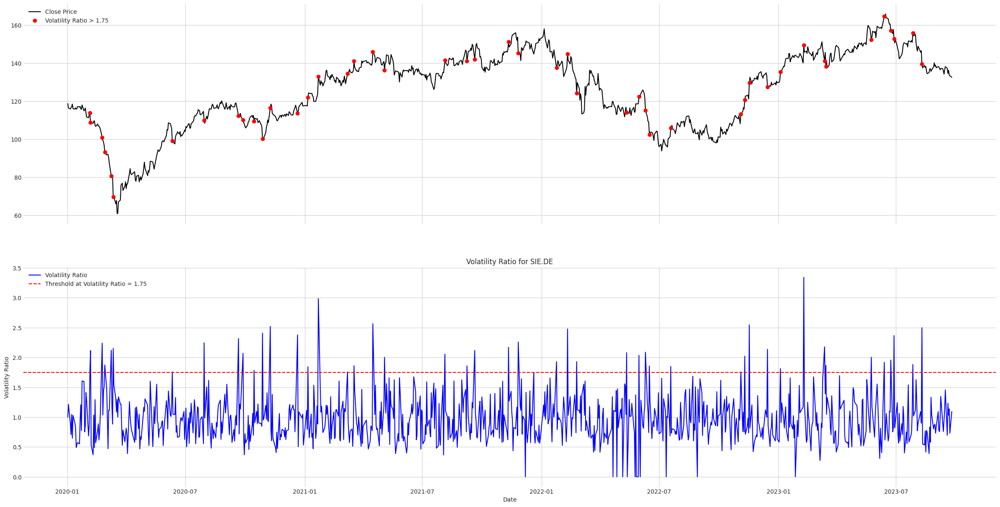

In [49]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Ticker
ticker = "SIE.DE"

# Download historical data
data = yf.download(ticker, start='2020-01-01', end='2023-11-21')

# Calculate True Range
data['High_Low'] = data['High'] - data['Low']
data['High_PrevClose'] = abs(data['High'] - data['Close'].shift())
data['Low_PrevClose'] = abs(data['Low'] - data['Close'].shift())
data['True_Range'] = data[['High_Low', 'High_PrevClose', 'Low_PrevClose']].max(axis=1)

# Calculate N-day EMA of True Range
n = 14
data['EMA_True_Range'] = data['True_Range'].ewm(span=n, adjust=False).mean()

# Calculate Volatility Ratio
data['Volatility_Ratio'] = data['True_Range'] / data['EMA_True_Range']

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, sharex=True, figsize=(30, 15))

# Plot close price
ax1.plot(data.index, data['Close'], label='Close Price', color='black')
ratio = 1.75

# Mark points where Volatility Ratio is above ratio
above_1_5 = data['Volatility_Ratio'] > ratio
ax1.plot(data.index[above_1_5], data['Close'][above_1_5], 'ro', label=f'Volatility Ratio > {ratio}')
ax1.legend(loc='upper left')

# Plot Volatility Ratio
ax2.plot(data.index, data['Volatility_Ratio'], label='Volatility Ratio', color='blue')
ax2.axhline(y=ratio, color='red', linestyle='--', label=f'Threshold at Volatility Ratio = {ratio}')
ax2.set_title('Volatility Ratio for SIE.DE')
ax2.set_xlabel('Date')
ax2.set_ylabel('Volatility Ratio')
ax2.legend(loc='upper left')

plt.show()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


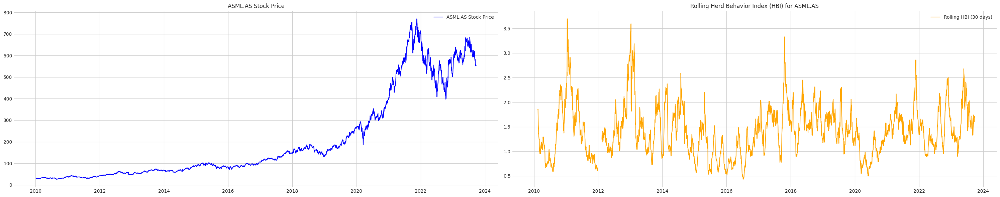

In [50]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Download ASML.AS and ^AEX data
asml = yf.download("ASML.AS", start='2010-01-01', end='2023-12-29')
aex = yf.download('^AEX', start='2010-01-01', end='2023-12-29')

# Calculate daily returns
asml_returns = asml['Close'].pct_change().dropna()
aex_returns = aex['Close'].pct_change().dropna()

# Define the rolling window size
window_size = 30

# Calculate the rolling HBI
rolling_hbi = (np.abs(asml_returns - aex_returns).rolling(window_size).mean() /
               np.abs(aex_returns).rolling(window_size).mean())

# Plot ASML.AS stock price and rolling HBI
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 6), sharex=True)

ax1.plot(asml['Close'], label='ASML.AS Stock Price', color='blue')
ax1.set_title('ASML.AS Stock Price')
ax1.legend()

ax2.plot(rolling_hbi, label='Rolling HBI (30 days)', color='orange')
ax2.set_title('Rolling Herd Behavior Index (HBI) for ASML.AS')
ax2.legend()

plt.tight_layout()
plt.show()

[*********************100%%**********************]  16 of 16 completed


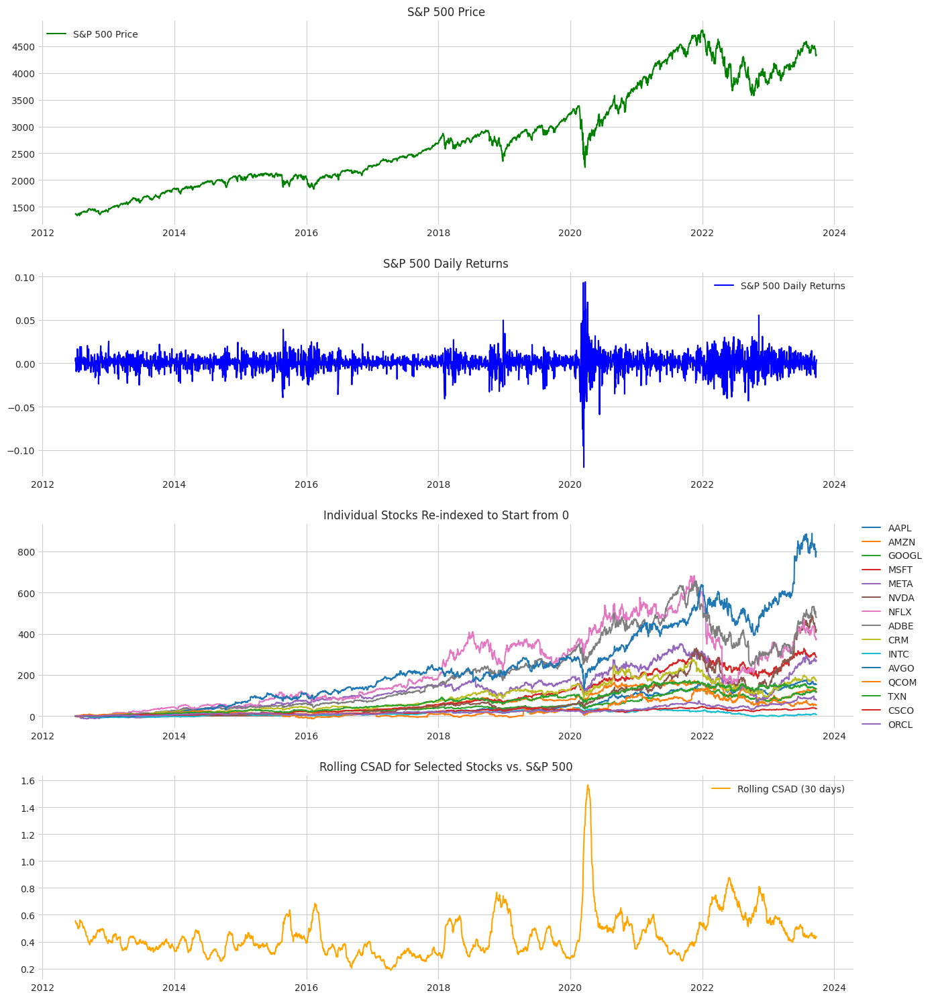

In [51]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Extended list of tech stocks along with S&P 500
tickers = ["AAPL", "AMZN", "GOOGL", "MSFT", "META", "NVDA", "NFLX", "ADBE", "CRM",
           "INTC", "AVGO", "QCOM", "TXN", "CSCO", "ORCL", "^GSPC"]
data = yf.download(tickers, start='2000-01-01', end='2023-12-29')['Close']

# Calculate daily returns
returns = data.pct_change().dropna()

# Define rolling window size
window_size = 30

def rolling_csad(stock_returns, market_returns, window):
    csad_values = []
    for i in range(len(stock_returns) - window + 1):
        window_data = stock_returns.iloc[i:i+window]
        window_market = market_returns[i:i+window].mean()
        N = len(window_data.columns)
        csad = (N / (N - 1)) * np.sum(np.abs(window_data.sub(window_market, axis=0)).mean(axis=1))
        csad_values.append(csad)
    return pd.Series(csad_values, index=stock_returns.index[window-1:])

# Calculate rolling CSAD for selected stocks compared to S&P 500
rolling_csad_values = rolling_csad(returns[tickers[:-1]], returns["^GSPC"], window_size)

# Align the data dates with rolling_csad_values dates
aligned_data = data.loc[rolling_csad_values.index]

# Re-index stocks to start from 0
aligned_data_zeroed = aligned_data.sub(aligned_data.iloc[0])

# Plotting
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(14, 15))

# Plot S&P 500 price
ax1.plot(aligned_data["^GSPC"], label='S&P 500 Price', color='green')
ax1.set_title('S&P 500 Price')
ax1.legend()

# Plot S&P 500 returns
ax2.plot(returns.loc[rolling_csad_values.index, "^GSPC"], label='S&P 500 Daily Returns', color='blue')
ax2.set_title('S&P 500 Daily Returns')
ax2.legend()

# Plot re-indexed stocks
for ticker in tickers[:-1]: # we exclude ^GSPC
    ax3.plot(aligned_data_zeroed[ticker], label=ticker)
ax3.set_title('Individual Stocks Re-indexed to Start from 0')
ax3.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Plot Rolling CSAD
ax4.plot(rolling_csad_values, label='Rolling CSAD (30 days)', color='orange')
ax4.set_title('Rolling CSAD for Selected Stocks vs. S&P 500')
ax4.legend()

plt.tight_layout()
plt.show()

[*********************100%%**********************]  2 of 2 completed


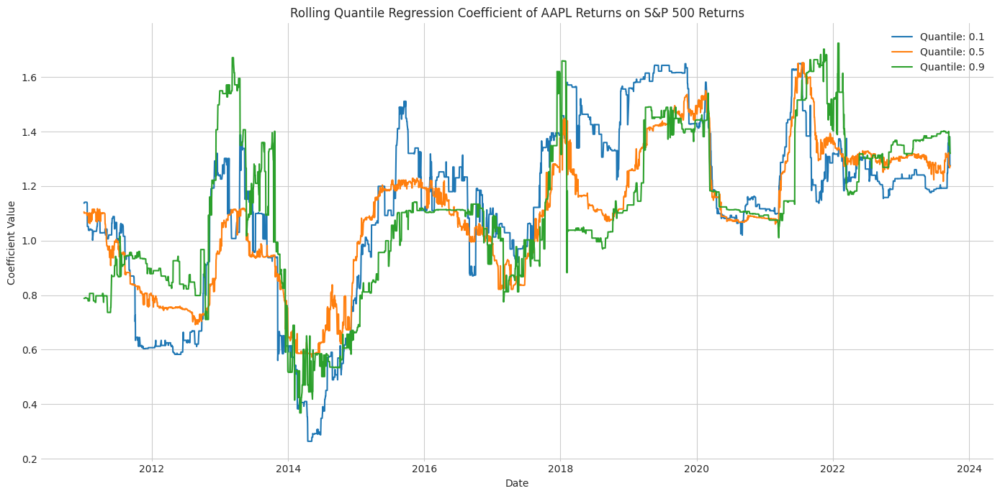

In [52]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')

# Download data for a selected stock and S&P 500
tickers = ["AAPL", "^GSPC"]
data = yf.download(tickers, start='2010-01-01', end='2023-12-29')['Close']

# Calculate daily returns
returns = data.pct_change().dropna()

# Create a DataFrame for regression
df = returns.copy()
df.columns = ['AAPL', 'SP500']

# Define quantiles and rolling window
quantiles = [0.1, 0.5, 0.9]
window = 252  # Roughly one year of trading days

# Store rolling regression results
rolling_params = {quantile: {"Intercept": [], "SP500": []} for quantile in quantiles}

for start in range(0, len(df) - window):
    window_data = df.iloc[start:start + window]
    for quantile in quantiles:
        mod = smf.quantreg('AAPL ~ SP500', window_data)
        res = mod.fit(q=quantile)
        rolling_params[quantile]["Intercept"].append(res.params["Intercept"])
        rolling_params[quantile]["SP500"].append(res.params["SP500"])

# Convert results to DataFrames for plotting
rolling_index = df.index[window - 1:-1]  # Adjusted to match the correct length
rolling_dfs = {quantile: pd.DataFrame(data, index=rolling_index) for quantile, data in rolling_params.items()}

# Plotting
plt.figure(figsize=(14, 7))
for quantile in quantiles:
    plt.plot(rolling_dfs[quantile]["SP500"], label=f'Quantile: {quantile}')

plt.title('Rolling Quantile Regression Coefficient of AAPL Returns on S&P 500 Returns')
plt.xlabel('Date')
plt.ylabel('Coefficient Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

[*********************100%%**********************]  15 of 15 completed


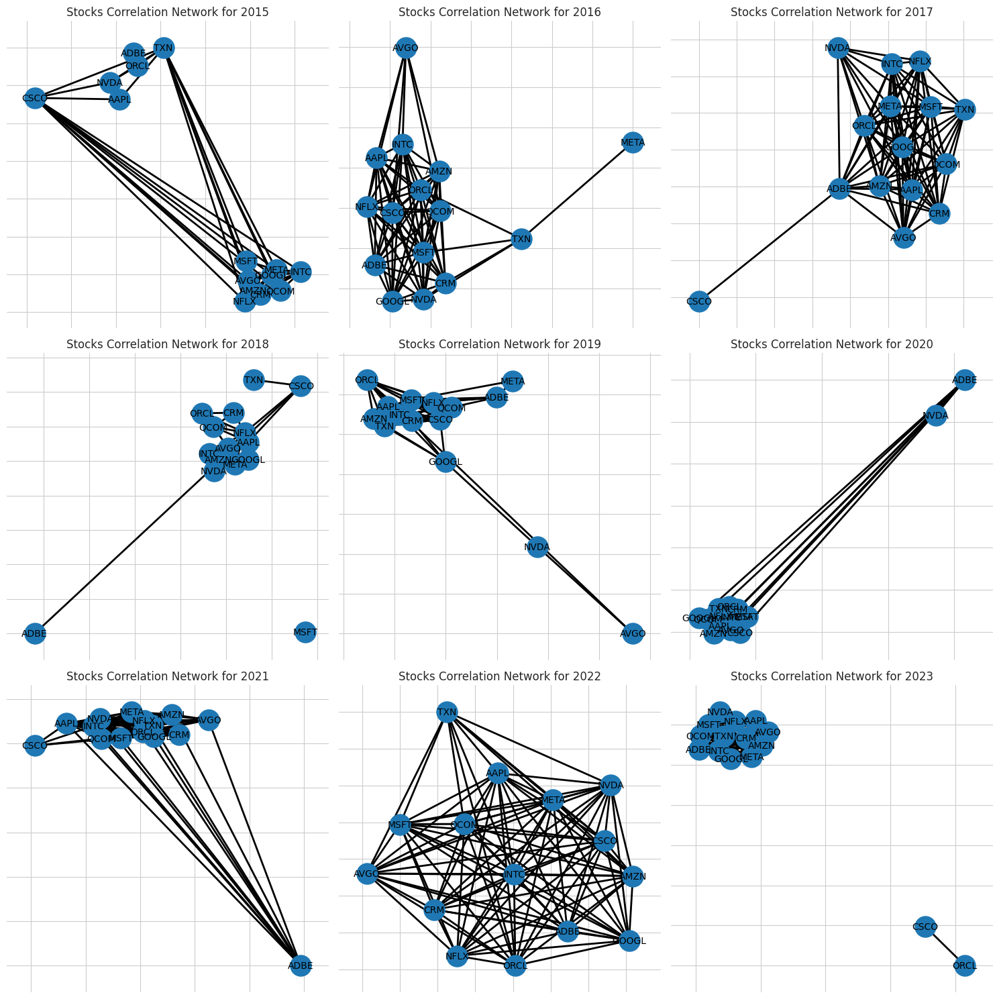

In [53]:
import yfinance as yf
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Define the tickers and fetch the data
tickers = ["AAPL", "AMZN", "GOOGL", "MSFT", "META", "NVDA", "NFLX", "ADBE", "CRM",
           "INTC", "AVGO", "QCOM", "TXN", "CSCO", "ORCL"]
data = yf.download(tickers, start='2015-01-01', end='2024-12-31')['Close']

def plot_network_for_year(data_for_year, ax):
    # Calculate correlation for that year
    corr_matrix = data_for_year.corr()

    # Initialize a graph
    G = nx.Graph()

    # Add nodes
    for ticker in tickers:
        G.add_node(ticker)

    # Add edges based on a correlation threshold
    threshold = 0.5
    for i in range(len(tickers)):
        for j in range(i+1, len(tickers)):
            if abs(corr_matrix.iloc[i, j]) > threshold:
                G.add_edge(tickers[i], tickers[j], weight=corr_matrix.iloc[i, j])

    # Draw the graph
    pos = nx.spring_layout(G)  # positions for all nodes
    nx.draw_networkx_nodes(G, pos, node_size=500, ax=ax)
    nx.draw_networkx_edges(G, pos, width=2, ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=10, font_family="sans-serif", ax=ax)
    ax.set_title(f'Stocks Correlation Network for {data_for_year.index[0].year}')

# Set up the figure with 9 subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for i, year in enumerate(range(2015, 2024)):
    ax = axes[i//3, i%3]
    plot_network_for_year(data[str(year)], ax)

plt.tight_layout()
plt.show()

[*********************100%%**********************]  21 of 21 completed


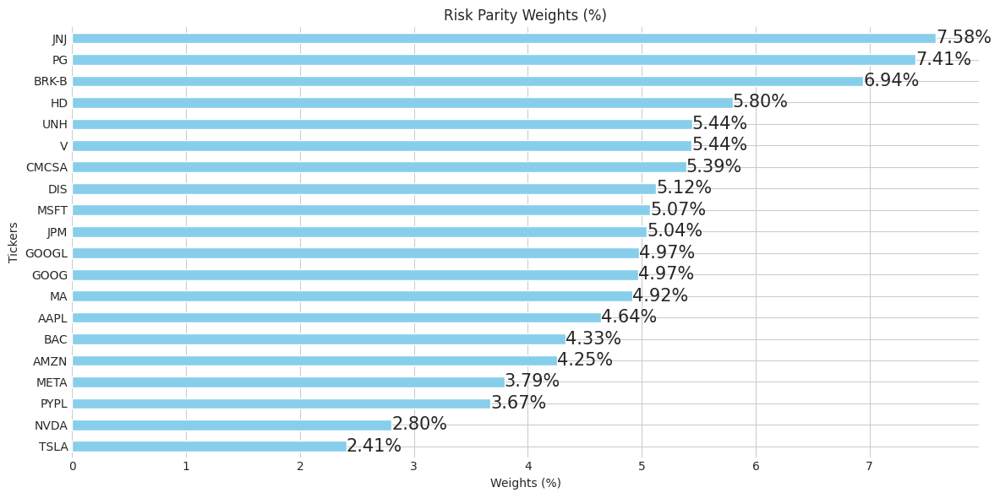

In [54]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def fetch_data(tickers):
    data = yf.download(tickers + ['^GSPC'], start="2010-01-01", end="2023-01-01")['Adj Close']
    return data

def calculate_weights(data):
    returns = data.pct_change().dropna()
    vol = returns.rolling(window=60).std().mean()[:-1]  # Exclude S&P 500 index
    inv_vol = 1 / vol
    weights = inv_vol / np.sum(inv_vol)
    return weights * 100  # Convert to percentage

def plot_weights(weights):
    plt.figure(figsize=(12,6))
    weights_sorted = weights.sort_values()
    ax = weights_sorted.plot(kind='barh', color='skyblue')
    plt.title('Risk Parity Weights (%)')
    plt.xlabel('Weights (%)')
    plt.ylabel('Tickers')

    # Adding labels to the bars
    for i, v in enumerate(weights_sorted):
        ax.text(v , i, f"{v:.2f}%", va='center', fontweight='light', fontsize=15)

    plt.tight_layout()
    plt.show()

# Main
tickers = ['AAPL', 'MSFT', 'AMZN', 'META', 'GOOGL', 'GOOG', 'TSLA', 'BRK-B', 'NVDA', 'JPM',
           'JNJ', 'V', 'PG', 'UNH', 'MA', 'DIS', 'HD', 'PYPL', 'BAC', 'CMCSA']
data = fetch_data(tickers)
weights = calculate_weights(data)
plot_weights(weights)

[*********************100%%**********************]  21 of 21 completed


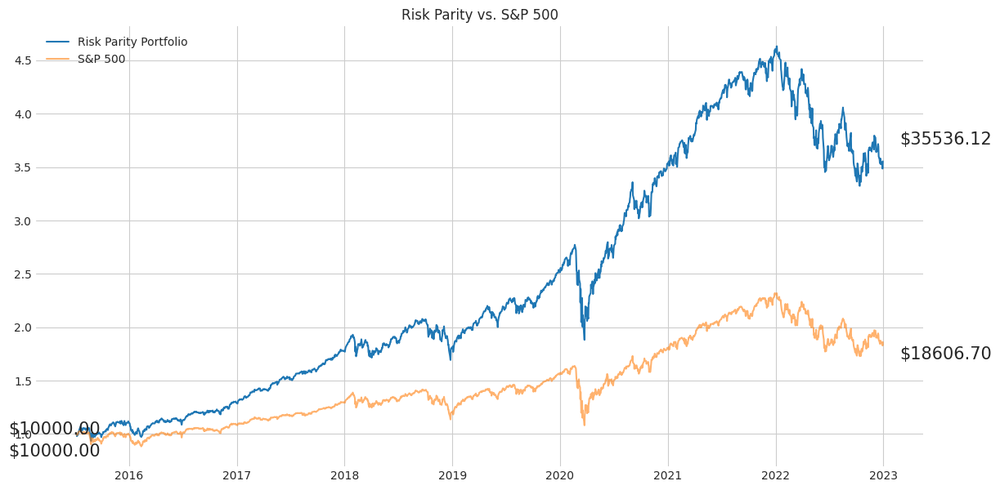

In [55]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def fetch_returns(tickers):
    data = yf.download(tickers + ['^GSPC'], start="2010-01-01", end="2023-01-01")['Adj Close']
    return data.pct_change().dropna()

def calculate_weights(data):
    vol = data.rolling(window=60).std().dropna().iloc[-1][:-1]  # Exclude S&P 500 index
    inv_vol = 1 / vol
    weights = inv_vol / np.sum(inv_vol)
    return weights

def simulate_portfolio(returns, n_days=60):
    port_val = [1]
    sp500_val = [1]
    weights = np.ones(len(tickers)) / len(tickers)  # Start with equal weights

    for i in range(len(returns)):
        if i < 60:  # If less than rolling window, use equal weights
            daily_port_return = np.dot(returns.iloc[i][:-1], weights)
        else:
            if i % n_days == 0:  # Rebalancing
                weights = calculate_weights(returns.iloc[i-60:i])
            daily_port_return = np.dot(returns.iloc[i][:-1], weights)

        port_val.append(port_val[-1] * (1 + daily_port_return))
        sp500_val.append(sp500_val[-1] * (1 + returns.iloc[i]['^GSPC']))
    return port_val, sp500_val

def plot_results(returns, port_val, sp500_val):
    plt.figure(figsize=(14, 7))
    plt.plot(returns.index, port_val[:-1], label='Risk Parity Portfolio')
    plt.plot(returns.index, sp500_val[:-1], label='S&P 500', alpha=0.6)
    plt.legend()
    plt.title('Risk Parity vs. S&P 500')

    # Annotations for initial and final values
    initial_val = 10000
    final_rp = port_val[-2] * initial_val  # port_val[-2] because we have an extra entry in port_val list
    final_sp500 = sp500_val[-2] * initial_val  # same reason here

    plt.annotate(f"${initial_val:.2f}", (returns.index[0], port_val[0]),
                 xytext=(-60,0), textcoords="offset points",
                 arrowprops=dict(arrowstyle="->"), fontsize=15)
    plt.annotate(f"${final_rp:.2f}", (returns.index[-1], port_val[-2]),
                 xytext=(15,15), textcoords="offset points",
                 arrowprops=dict(arrowstyle="->"), fontsize=15)
    plt.annotate(f"${initial_val:.2f}", (returns.index[0], sp500_val[0]),
                 xytext=(-60,-20), textcoords="offset points",
                 arrowprops=dict(arrowstyle="->"), fontsize=15)
    plt.annotate(f"${final_sp500:.2f}", (returns.index[-1], sp500_val[-2]),
                 xytext=(15,-15), textcoords="offset points",
                 arrowprops=dict(arrowstyle="->"), fontsize=15)

    plt.show()

# Main
tickers = ['AAPL', 'MSFT', 'AMZN', 'META', 'GOOGL', 'GOOG', 'TSLA', 'BRK-B', 'NVDA', 'JPM',
           'JNJ', 'V', 'PG', 'UNH', 'MA', 'DIS', 'HD', 'PYPL', 'BAC', 'CMCSA']
returns = fetch_returns(tickers)
port_val, sp500_val = simulate_portfolio(returns, n_days=30)
plot_results(returns, port_val, sp500_val)

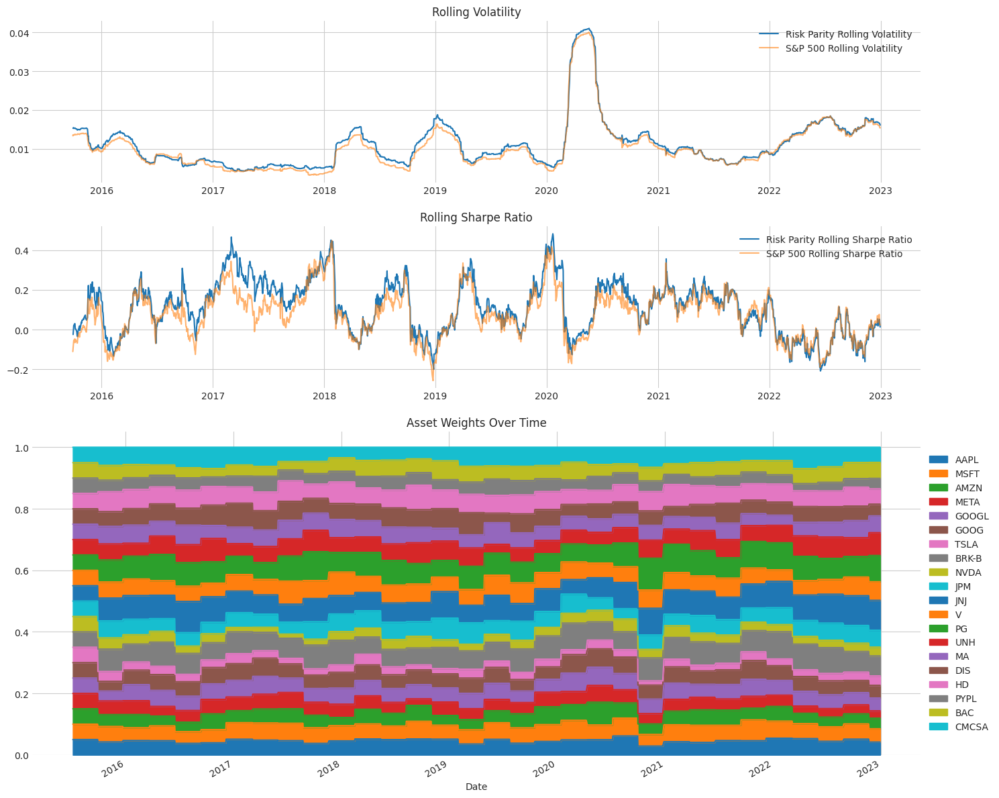

In [56]:
import matplotlib.gridspec as gridspec

# Calculate rolling metrics
rolling_vol_rp = pd.Series(port_val[:-1]).pct_change().rolling(window=60).std()
rolling_vol_sp = returns['^GSPC'].rolling(window=60).std()
rolling_sharpe_rp = pd.Series(port_val[:-1]).pct_change().rolling(window=60).mean() / rolling_vol_rp
rolling_sharpe_sp = returns['^GSPC'].rolling(window=60).mean() / rolling_vol_sp

# Calculate weights over time
weights_df = pd.DataFrame(index=returns.index, columns=tickers)
for i, date in enumerate(returns.index):
    if i < 60:
        weights_df.loc[date] = np.ones(len(tickers)) / len(tickers)
    elif i % 60 == 0:
        weights_df.loc[date] = calculate_weights(returns.iloc[i-60:i])
    else:
        weights_df.loc[date] = weights_df.iloc[i-1]

# Create subplots
fig = plt.figure(figsize=(15, 12))
gs = gridspec.GridSpec(3, 1, height_ratios=[1,1,2])

# Plot rolling volatility
ax0 = plt.subplot(gs[0])
ax0.plot(returns.index, rolling_vol_rp, label='Risk Parity Rolling Volatility')
ax0.plot(returns.index, rolling_vol_sp, label='S&P 500 Rolling Volatility', alpha=0.6)
ax0.legend()
ax0.set_title('Rolling Volatility')

# Plot rolling Sharpe ratio
ax1 = plt.subplot(gs[1])
ax1.plot(returns.index, rolling_sharpe_rp, label='Risk Parity Rolling Sharpe Ratio')
ax1.plot(returns.index, rolling_sharpe_sp, label='S&P 500 Rolling Sharpe Ratio', alpha=0.6)
ax1.legend()
ax1.set_title('Rolling Sharpe Ratio')

# Plot asset weights over time
ax2 = plt.subplot(gs[2])
weights_df.plot(kind='area', stacked=True, ax=ax2, legend=False)
ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax2.set_title('Asset Weights Over Time')

plt.tight_layout()
plt.show()

[*********************100%%**********************]  1 of 1 completed


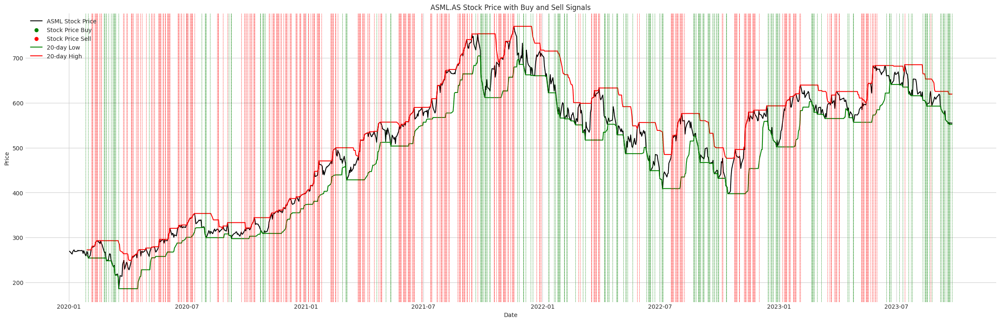

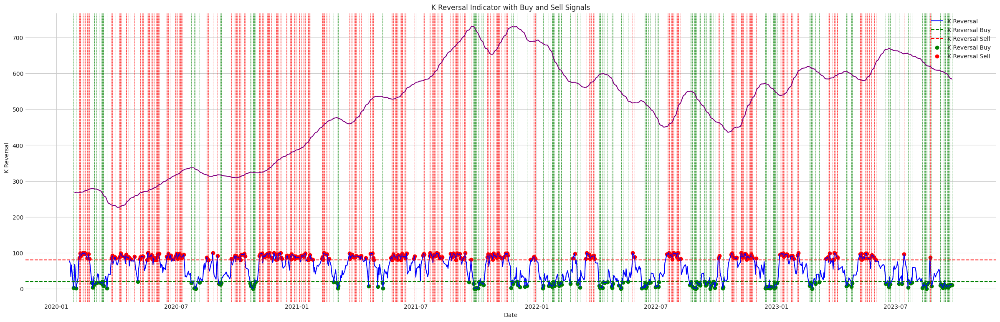

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

ticker = "ASML.AS"
df = yf.download(ticker, start="2020-01-01", end="2023-12-26")

df['Date'] = df.index


# Define a function to calculate the K reversal
def calculate_k_reversal(df, n=14):
    highs = df['High'].rolling(n).max()
    lows = df['Low'].rolling(n).min()
    k_values = 100 * (df['Close'] - lows) / (highs - lows)
    return k_values

# Calculate the K reversal and the buy and sell signals for the K reversal
# Buy and sell thresholds can be adjusted for fewer false positives
k_values = calculate_k_reversal(df)
buy_signals_k = k_values[k_values < 20]
sell_signals_k = k_values[k_values > 80]

# Calculate the buy and sell signals for the stock price
buy_signals_price = df[df['Close'] < df['Close'].rolling(20).min()]['Close']
sell_signals_price = df[df['Close'] > df['Close'].rolling(20).max()]['Close']

# Create a plot for the ASML stock price with buy and sell signals
fig, ax = plt.subplots(figsize=(30, 9))

ax.plot(df['Date'], df['Close'], color='black', label='ASML Stock Price')
ax.scatter(buy_signals_price.index, buy_signals_price.values, color='green', label='Stock Price Buy')
ax.scatter(sell_signals_price.index, sell_signals_price.values, color='red', label='Stock Price Sell')
ax.plot(df['Date'], df['Close'].rolling(20).min(), color='green', label='20-day Low')
ax.plot(df['Date'], df['Close'].rolling(20).max(), color='red', label='20-day High')

# Draw vertical lines based on the K reversal buy/sell signals
for date in buy_signals_k.index:
    ax.axvline(date, color='g', alpha=1, linestyle='--', linewidth=0.5)
for date in sell_signals_k.index:
    ax.axvline(date, color='r', alpha=1, linestyle='--', linewidth=0.5)

ax.legend(loc='upper left')
ax.set(title=f'{ticker} Stock Price with Buy and Sell Signals', xlabel='Date', ylabel='Price')

plt.show()

# Create a plot for the K reversal indicator with buy and sell signals
fig, ax = plt.subplots(figsize=(30,9))

ax.plot(df['Date'], k_values, color='blue', label='K Reversal')
ax.axhline(y=20, color='green', linestyle='--', label='K Reversal Buy')
ax.axhline(y=80, color='red', linestyle='--', label='K Reversal Sell')
ax.scatter(buy_signals_k.index, buy_signals_k.values, color='green', label='K Reversal Buy')
ax.scatter(sell_signals_k.index, sell_signals_k.values, color='red', label='K Reversal Sell')

for date in buy_signals_k.index:
    ax.axvline(date, color='g', alpha=1, linestyle='--', linewidth=0.5)
for date in sell_signals_k.index:
    ax.axvline(date, color='r', alpha=1, linestyle='--', linewidth=0.5)

ax.legend()
ax.set(title='K Reversal Indicator with Buy and Sell Signals', xlabel='Date', ylabel='K Reversal')

# Sample snippet of K-Reversal in conjunction with a simple moving average
sma = df['Close'].rolling(window=20).mean()
ax.plot(df['Date'], sma, color='purple', label='20-day Simple Moving Average')

plt.show()

In [62]:
import yfinance as yf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ipywidgets import interact, widgets

# Download historical data for desired stock
symbol = "VOW.DE"
data = yf.download(symbol, start='2000-01-01', end='2023-12-02')

# Initial values for the parameters
initial_n_days = 20
initial_up_target = data['Adj Close'].iloc[-1] + 50
initial_down_target = data['Adj Close'].iloc[-1] - 50

def estimate_probability(n_days, initial_price, up_target, down_target):
    # Calculate the thresholds for price change
    up_threshold = round(abs((up_target - initial_price) / initial_price), 3)
    down_threshold = round(abs((down_target - initial_price) / initial_price), 3)

    # Calculate the n-day percentage change
    data[f'{n_days}d_pct_change'] = data['Adj Close'].pct_change(n_days)

    # Calculate the frequency of the threshold price change
    total_periods = len(data)
    down_periods = len(data[data[f'{n_days}d_pct_change'] <= -down_threshold])
    up_periods = len(data[data[f'{n_days}d_pct_change'] >= up_threshold])
    down_frequency = down_periods / total_periods
    up_frequency = up_periods / total_periods

    # Plotting
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 8))
    sns.histplot(data=data, x=f'{n_days}d_pct_change', kde=True, bins=100, ax=ax1)
    ax1.axvline(x=-down_threshold, color='r', linestyle='--', label=f"{down_threshold * 100:.2f}% decrease frequency: {down_frequency * 100:.2f}%")
    ax1.axvline(x=up_threshold, color='b', linestyle='--', label=f"{up_threshold * 100:.2f}% increase frequency: {up_frequency * 100:.2f}%")

    ax1.set_xlabel('Percentage change')
    ax1.set_ylabel('Frequency')
    ax1.set_title(f'Distribution of {n_days}-day percentage changes for {symbol}')
    ax1.legend(fontsize=20)

    data['Adj Close'].plot(ax=ax2)
    up_instances = data[data[f'{n_days}d_pct_change'] >= up_threshold]
    down_instances = data[data[f'{n_days}d_pct_change'] <= -down_threshold]
    ax2.scatter(up_instances.index, up_instances['Adj Close'], color='b', marker='^', label=f"{up_threshold * 100:.2f}% increase")
    ax2.scatter(down_instances.index, down_instances['Adj Close'], color='r', marker='v', label=f"{down_threshold * 100:.2f}% decrease")

    ax2.set_xlabel('Date')
    ax2.set_ylabel('Adjusted Close Price')
    ax2.set_title(f'Stock Price for {symbol}')
    ax2.legend(fontsize=20)

    plt.tight_layout()
    plt.show()

# Creating sliders for interactive inputs with initialized values
n_days_slider = widgets.IntSlider(min=1, max=100, step=1, value=initial_n_days, description="n_days")
initial_price_slider = widgets.FloatSlider(min=1, max=1000, step=0.01, value=data['Adj Close'].iloc[-1], description="Initial Price")
up_target_slider = widgets.FloatSlider(min=1, max=1000, step=0.01, value=initial_up_target, description="Up Target")
down_target_slider = widgets.FloatSlider(min=1, max=1000, step=0.01, value=initial_down_target, description="Down Target")

# Use interact function with estimate_probability function and the sliders
interact(estimate_probability, n_days=n_days_slider, initial_price=initial_price_slider, up_target=up_target_slider, down_target=down_target_slider);

[*********************100%%**********************]  1 of 1 completed


interactive(children=(IntSlider(value=20, description='n_days', min=1), FloatSlider(value=130.0, description='…

[*********************100%%**********************]  1 of 1 completed


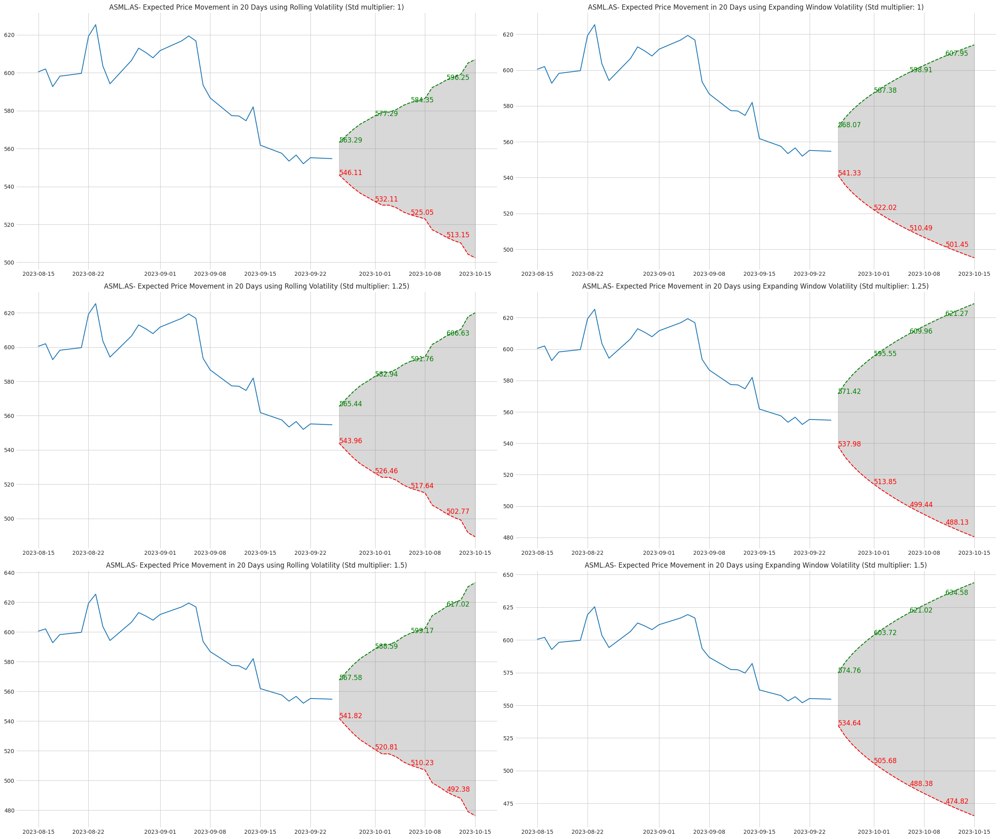

In [63]:
import numpy as np
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

# Define the stock ticker of interest
ticker = "ASML.AS"
# Download historical stock data for the given ticker within the specified date range
stock_data = yf.download(ticker, start="2020-01-01", end="2023-12-30")

# Specify the horizon for which the prediction cone should be plotted
time_horizon = 20

# Compute the daily returns based on the closing prices
stock_data['Returns'] = stock_data['Close'].pct_change()

# Fetch the most recent closing price from the data
current_price = stock_data.iloc[-1]['Close']

# Define multipliers which will determine the width of the cone (a higher multiplier means a wider cone)
std_multipliers = [1, 1.25, 1.5]

# Setup the plotting environment to accommodate plots for each multiplier and volatility calculation method (rolling and expanding)
fig, ax = plt.subplots(len(std_multipliers), 2, figsize=(25, 7 * len(std_multipliers)))

# Set the font size for price labels within the plot
label_font_size = 12

# Loop through each standard deviation multiplier to plot its respective cone
for std_index, std_multiplier in enumerate(std_multipliers):

    # Extract the last 30 days of closing prices
    plot_data = stock_data[-30:]['Close']

    # Create a date range for the prediction horizon
    date_range = pd.date_range(plot_data.index[-1] + pd.DateOffset(1), periods=time_horizon, freq='D')

    # Initialize series to store the upper and lower bounds of the cone
    expected_upper_bounds = pd.Series(index=date_range)
    expected_lower_bounds = pd.Series(index=date_range)

    # Compute the cone boundaries using rolling volatility
    for i in range(time_horizon):
        # Compute rolling volatility based on the past 30 days, updating the window for each day in the prediction horizon
        volatility = stock_data['Returns'].iloc[-(30+i):-i].std() if i > 0 else stock_data['Returns'].iloc[-(30+i):].std()
        expected_price_movement = current_price * volatility * np.sqrt(i + 1) * std_multiplier
        expected_upper_bounds.iloc[i] = current_price + expected_price_movement
        expected_lower_bounds.iloc[i] = current_price - expected_price_movement

    # Plot the last 30 days of actual prices and the predicted cone using rolling volatility
    ax[std_index][0].plot(plot_data, label=f'{ticker} - Past 30 Days')
    ax[std_index][0].plot(expected_upper_bounds, linestyle='--', color='green', label=f'Expected Upper Bound')
    ax[std_index][0].plot(expected_lower_bounds, linestyle='--', color='red', label=f'Expected Lower Bound')
    ax[std_index][0].fill_between(date_range, expected_upper_bounds, expected_lower_bounds, color='gray', alpha=0.3)
    ax[std_index][0].set_title(f'{ticker}- Expected Price Movement in {time_horizon} Days using Rolling Volatility (Std multiplier: {std_multiplier})')

    # Label the cone boundaries every 5 days
    for i in range(0, time_horizon, 5):
        ax[std_index][0].text(date_range[i], expected_upper_bounds[i], f'{expected_upper_bounds[i]:.2f}', color='green', fontsize=label_font_size)
        ax[std_index][0].text(date_range[i], expected_lower_bounds[i], f'{expected_lower_bounds[i]:.2f}', color='red', fontsize=label_font_size)

    # Compute the cone boundaries using expanding window volatility
    for i in range(time_horizon):
        # Compute expanding window volatility from the beginning of the data up to the current point in the prediction horizon
        volatility = stock_data['Returns'].iloc[:-(time_horizon-i)].std() * std_multiplier
        expected_price_movement = current_price * volatility * np.sqrt(i + 1)
        expected_upper_bounds.iloc[i] = current_price + expected_price_movement
        expected_lower_bounds.iloc[i] = current_price - expected_price_movement

    # Plot the last 30 days of actual prices and the predicted cone using expanding window volatility
    ax[std_index][1].plot(plot_data, label=f'{ticker} - Past 30 Days')
    ax[std_index][1].plot(expected_upper_bounds, linestyle='--', color='green', label=f'Expected Upper Bound')
    ax[std_index][1].plot(expected_lower_bounds, linestyle='--', color='red', label=f'Expected Lower Bound')
    ax[std_index][1].fill_between(date_range, expected_upper_bounds, expected_lower_bounds, color='gray', alpha=0.3)
    ax[std_index][1].set_title(f'{ticker}- Expected Price Movement in {time_horizon} Days using Expanding Window Volatility (Std multiplier: {std_multiplier})')

    # Label the cone boundaries every 5 days for expanding window volatility
    for i in range(0, time_horizon, 5):
        ax[std_index][1].text(date_range[i], expected_upper_bounds[i], f'{expected_upper_bounds[i]:.2f}', color='green', fontsize=label_font_size)
        ax[std_index][1].text(date_range[i], expected_lower_bounds[i], f'{expected_lower_bounds[i]:.2f}', color='red', fontsize=label_font_size)

# Adjust the layout to avoid any overlap and display the plots
plt.tight_layout()
plt.show()

[*********************100%%**********************]  1 of 1 completed


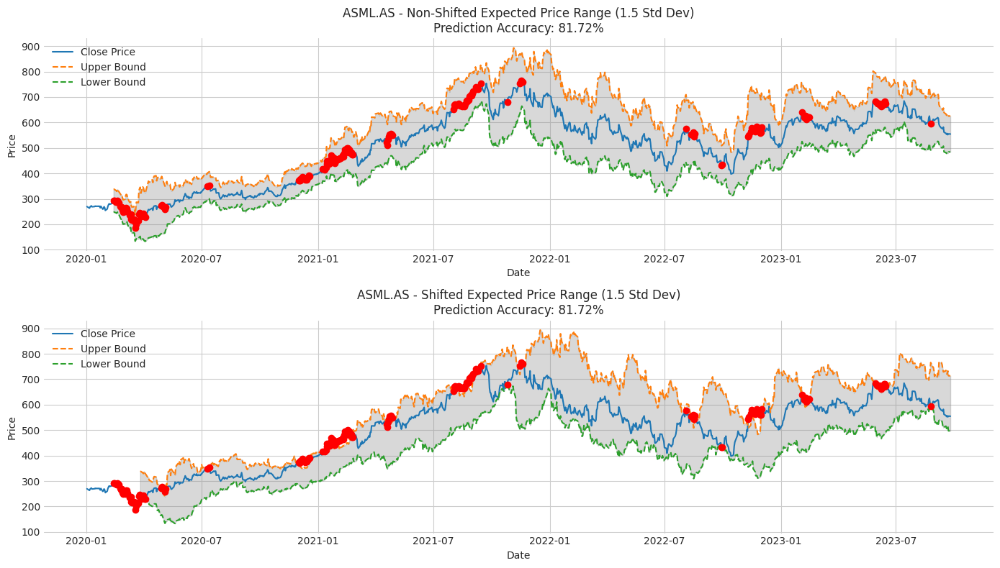

In [64]:
import numpy as np
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm

# Download historical stock data for ASML.AS between specified dates
ticker = "ASML.AS"
stock_data = yf.download(ticker, start="2020-01-01", end="2023-12-30")

# Calculate daily returns based on the 'Close' price
stock_data['Returns'] = stock_data['Close'].pct_change()

# Calculate rolling volatility over a lookback period of 30 days
lookback_period = 30
forward_days = 30
stock_data['Volatility'] = stock_data['Returns'].rolling(window=lookback_period).std()

# Calculate the expected price movement using a multiplier on the standard deviation
std_multiplier = 1.5
stock_data['Expected Move'] = stock_data['Close'] * stock_data['Volatility'] * np.sqrt(forward_days) * std_multiplier

# Compute expected upper and lower price boundaries
stock_data['Upper Price'] = stock_data['Close'] + stock_data['Expected Move']
stock_data['Lower Price'] = stock_data['Close'] - stock_data['Expected Move']

# Evaluate the accuracy of the model's predictions
successful_predictions = 0
total_predictions = 0
unsuccessful_predictions = []
for i in range(len(stock_data) - forward_days):
    upper_price = stock_data.iloc[i]['Upper Price']
    lower_price = stock_data.iloc[i]['Lower Price']
    actual_price = stock_data.iloc[i + forward_days]['Close']
    if lower_price <= actual_price <= upper_price:
        successful_predictions += 1
    else:
        unsuccessful_predictions.append(stock_data.index[i + forward_days])
    total_predictions += 1

prediction_accuracy = successful_predictions / total_predictions

# Store the original bounds before shifting them
stock_data['Original Upper Price'] = stock_data['Upper Price']
stock_data['Original Lower Price'] = stock_data['Lower Price']

# Shift the Upper Price and Lower Price columns by the number of forward_days
stock_data['Upper Price'] = stock_data['Upper Price'].shift(forward_days)
stock_data['Lower Price'] = stock_data['Lower Price'].shift(forward_days)

# Plotting the data using Matplotlib
fig, (ax1, ax2) = plt.subplots(2, figsize=(14, 8))

# First plot for non-shifted bounds
ax1.plot(stock_data['Close'], label='Close Price')
ax1.plot(stock_data['Original Upper Price'], label='Upper Bound', linestyle='--')
ax1.plot(stock_data['Original Lower Price'], label='Lower Bound', linestyle='--')
ax1.fill_between(stock_data.index, stock_data['Original Lower Price'], stock_data['Original Upper Price'], color='gray', alpha=0.3)
for date in unsuccessful_predictions:
    ax1.plot(date, stock_data.loc[date, 'Close'], 'ro')
ax1.set_title(f'{ticker} - Non-Shifted Expected Price Range ({std_multiplier} Std Dev)\nPrediction Accuracy: {prediction_accuracy * 100:.2f}%')
ax1.set_xlabel('Date')
ax1.set_ylabel('Price')
ax1.legend()
ax1.grid(True)

# Second plot for shifted bounds
ax2.plot(stock_data['Close'], label='Close Price')
ax2.plot(stock_data['Upper Price'], label='Upper Bound', linestyle='--')
ax2.plot(stock_data['Lower Price'], label='Lower Bound', linestyle='--')
ax2.fill_between(stock_data.index, stock_data['Lower Price'], stock_data['Upper Price'], color='gray', alpha=0.3)
for date in unsuccessful_predictions:
    ax2.plot(date, stock_data.loc[date, 'Close'], 'ro')
ax2.set_title(f'{ticker} - Shifted Expected Price Range ({std_multiplier} Std Dev)\nPrediction Accuracy: {prediction_accuracy * 100:.2f}%')
ax2.set_xlabel('Date')
ax2.set_ylabel('Price')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.show()